# Image Segmentation on video.

## Now let's try the results of the Gaussian Mixture Model on the frames of a video.

### Import necessary dependencies. Adjust dispaly settings.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.transform import resize
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from scipy import ndimage
import time

plt.rcParams['figure.figsize'] = [20, 10]

### Define the class for the DeepLabv3+ neural network.

In [2]:
class DeepLab:
    
    def __init__(self, selected_layer=405):
        from model import Deeplabv3
        import tensorflow as tf
        
        self.model = Deeplabv3(weights="pascal_voc", input_shape=(360, 640, 3), backbone="xception", classes=21)
        self.model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
        outputs = [layer.output for layer in self.model.layers]
        self.model = tf.keras.models.Model(inputs=self.model.inputs, outputs=outputs)
        
        for layer in self.model.layers: layer.trainable = False
        self.image_list = []
        self.selected_layer = selected_layer

    def preprocess_image(self, image):
        image = resize(image, (360, 640), anti_aliasing=True)
        image = np.expand_dims(image, axis=0)
        return image

    def get_features(self):
        feature_list = []
        for img in self.image_list:
            feature_map = self.model.predict(img)[self.selected_layer]
            feature_list.append(feature_map)
        return np.array(feature_list)
    
    def predict(self, image):
        image = self.preprocess_image(image)
        return self.model.predict(image)[self.selected_layer]

### Initialize the neural network class as well as the PCA transformer for extraction of Principal Components from the feature data. Initialize for n = 8 Principal Components.

In [3]:
deeplab = DeepLab()
pca = PCA(n_components=8)

### Initialize a Gaussian Mixture Model with n = 2 clusters. Read the frames of the video using OpenCV.

In [4]:
gmm_2 = GaussianMixture(n_components=2, covariance_type='tied')

vidcap = cv2.VideoCapture('C:\\Users\\me\\Desktop\\jujimufu.mp4')
success,image = vidcap.read()

count = 1
sum_time = 0

first_image_features = deeplab.predict(image)
n, w, h, d = first_image_features.shape

### Perform the feature extraction and Principal Component Analysis for a few frames and filter the result using max filter with size of 5. Plot the result and the original frame for comparison.

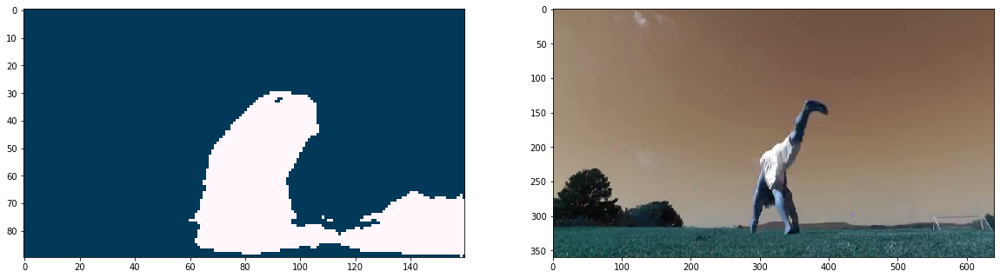

Frame processed: 160 Average time: 0.022473813593387605


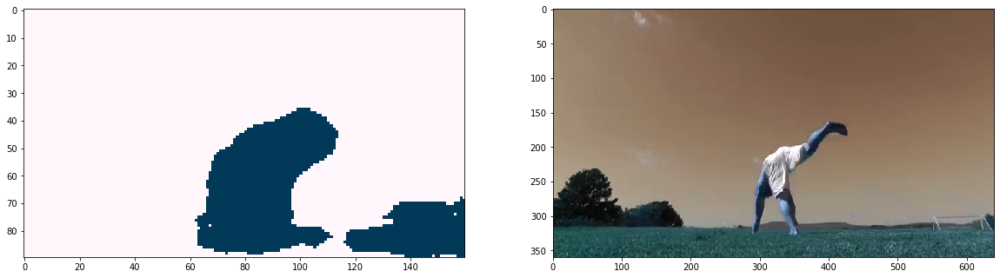

Frame processed: 161 Average time: 0.041854205338851265


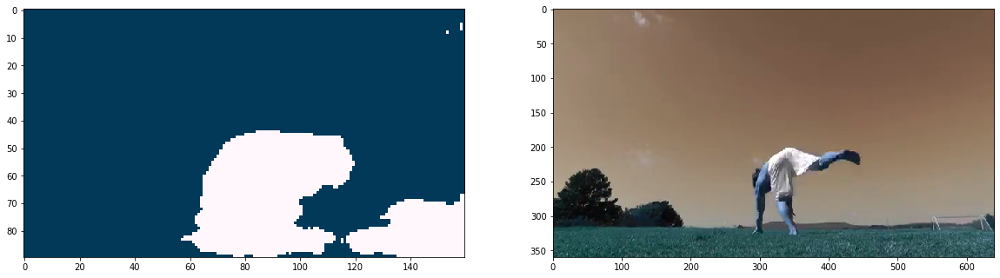

Frame processed: 162 Average time: 0.061124937033947606


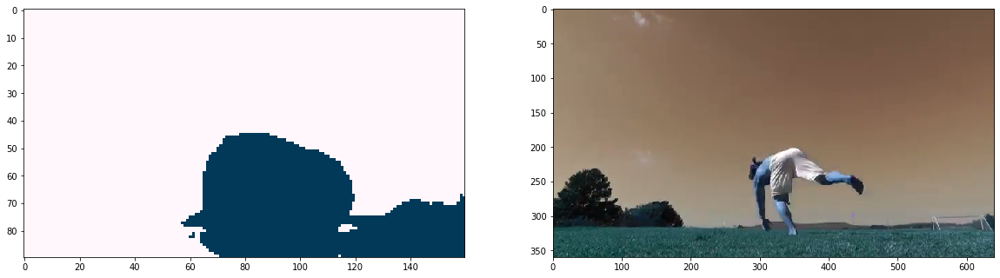

Frame processed: 163 Average time: 0.08034944680570824


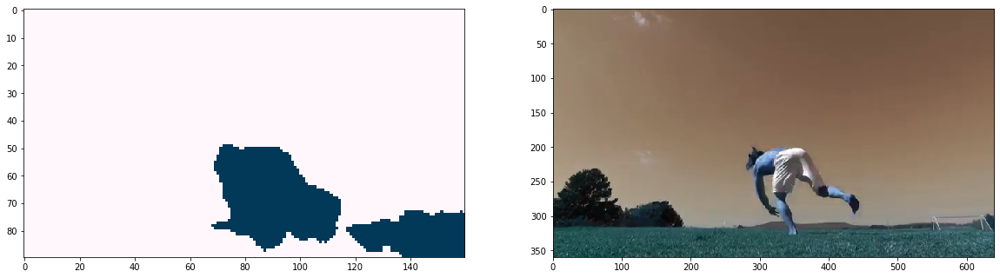

Frame processed: 164 Average time: 0.09910160157738662


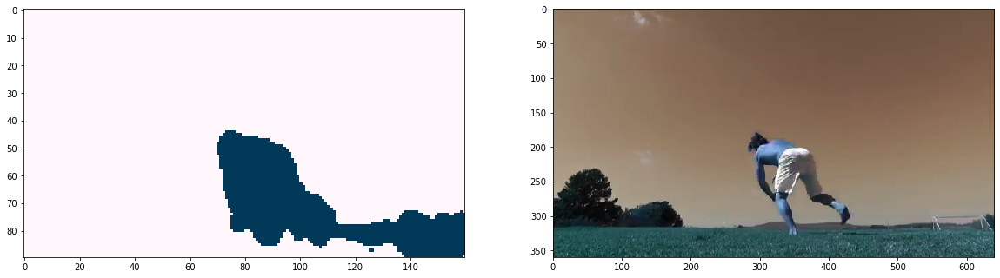

Frame processed: 165 Average time: 0.11742045084635416


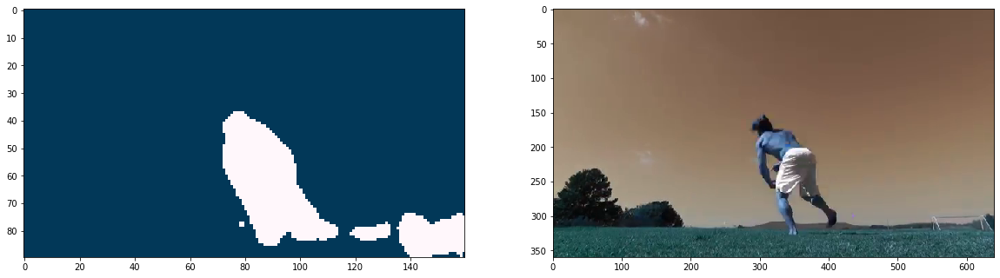

Frame processed: 166 Average time: 0.13554269434457802


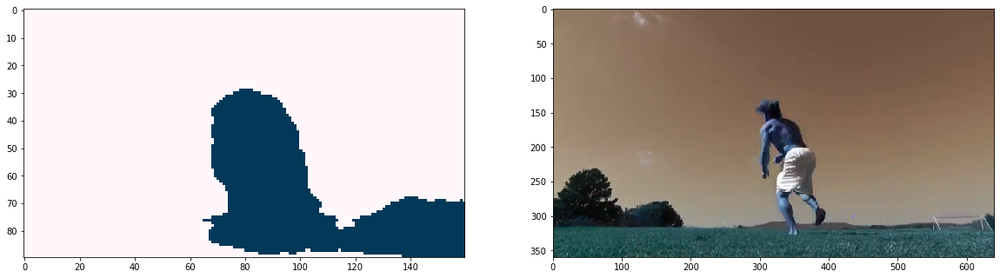

Frame processed: 167 Average time: 0.1531603165015489


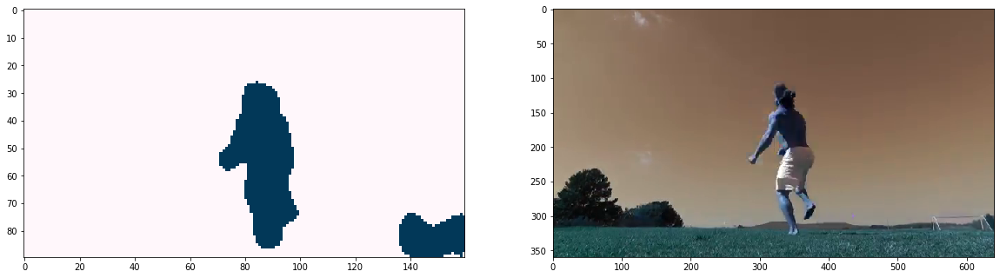

Frame processed: 168 Average time: 0.17060997514497667


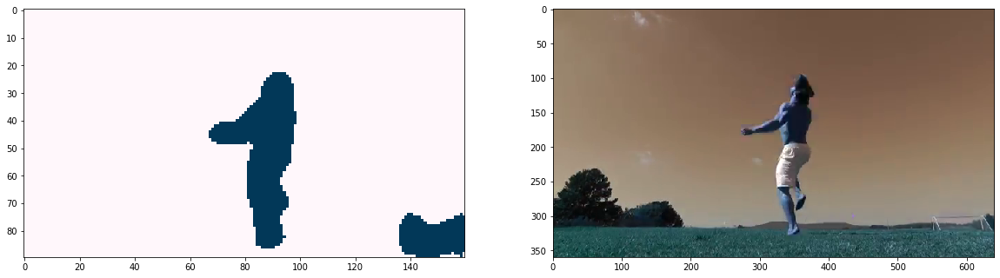

Frame processed: 169 Average time: 0.18803959767493975


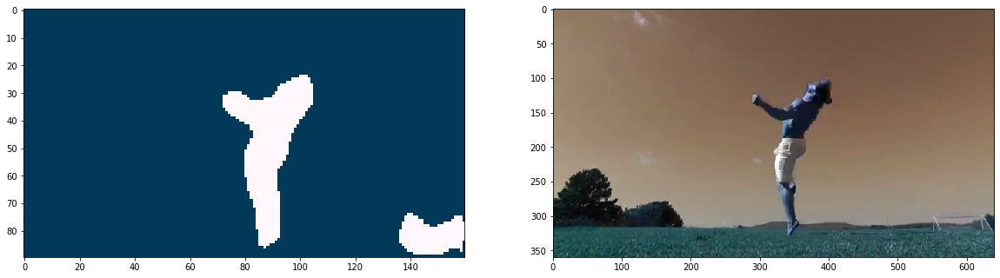

Frame processed: 170 Average time: 0.20727919830995448


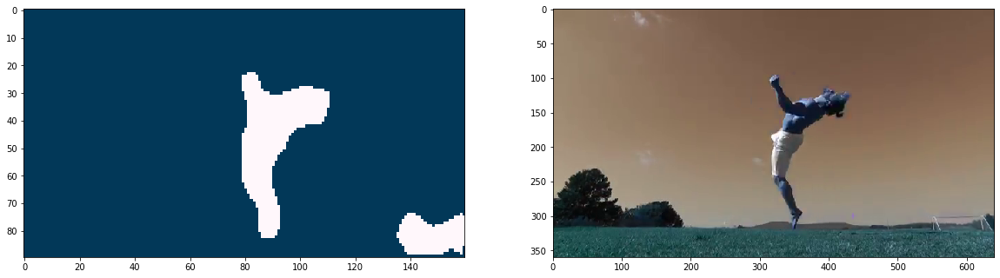

Frame processed: 171 Average time: 0.22517941430298208


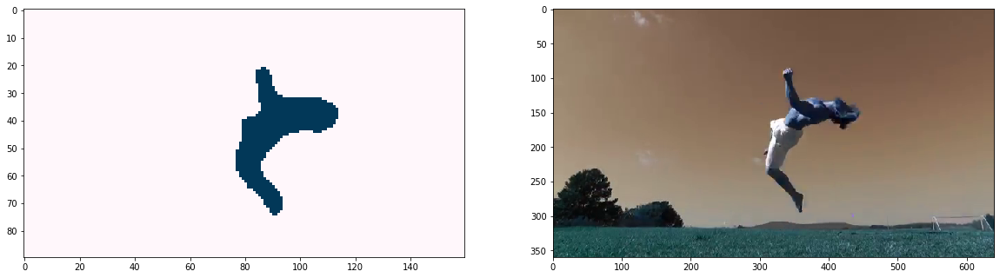

Frame processed: 172 Average time: 0.2432525546051735


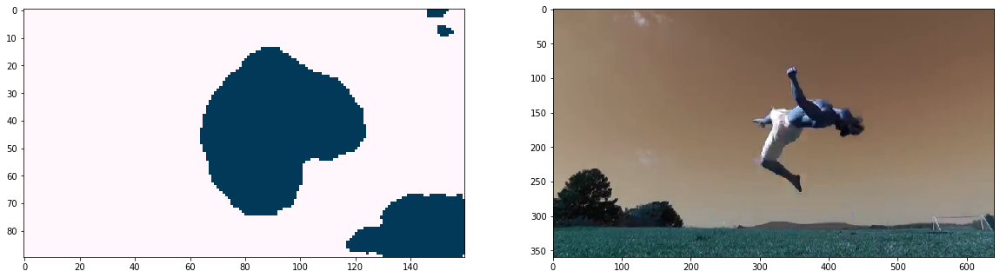

Frame processed: 173 Average time: 0.2597233752983843


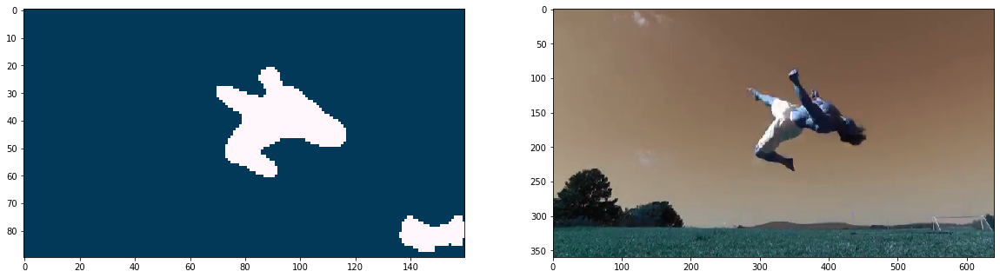

Frame processed: 174 Average time: 0.2764187626455022


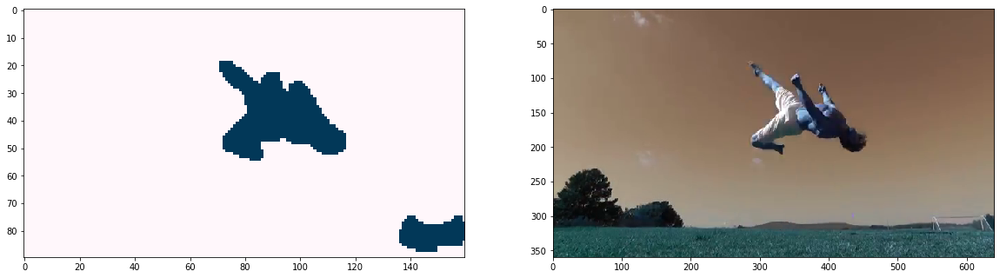

Frame processed: 175 Average time: 0.29262613705226354


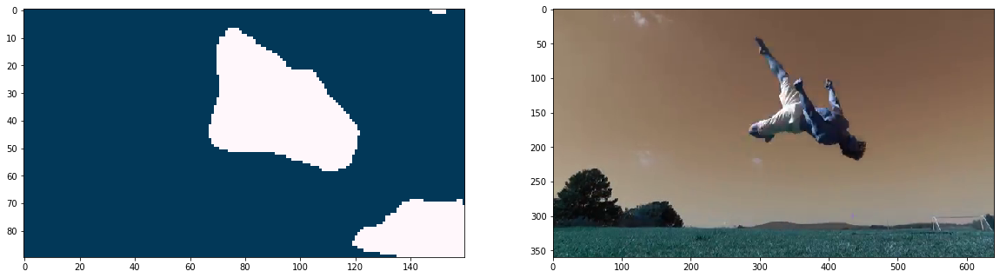

Frame processed: 176 Average time: 0.3079445876858451


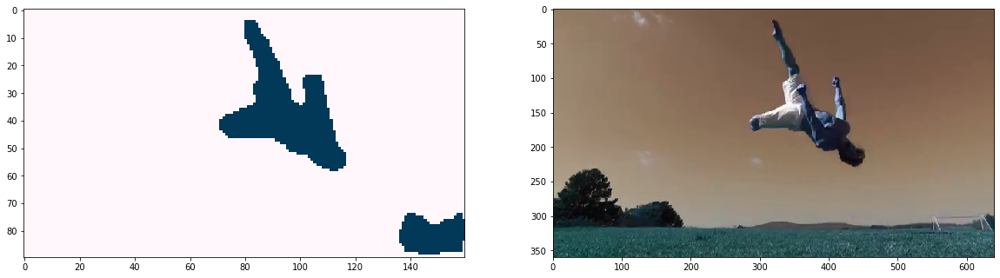

Frame processed: 177 Average time: 0.3236493970041221


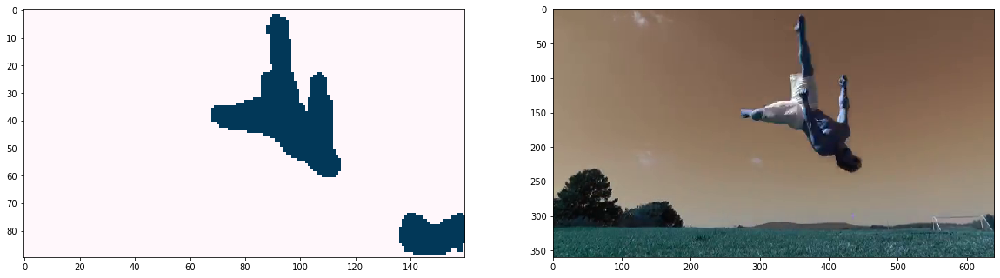

Frame processed: 178 Average time: 0.33903731121106095


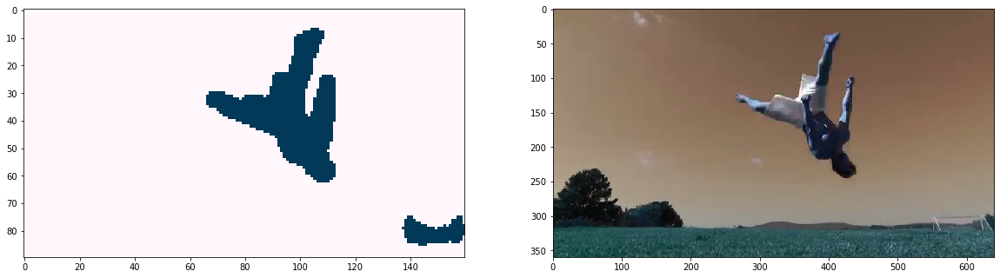

Frame processed: 179 Average time: 0.3544655458887196


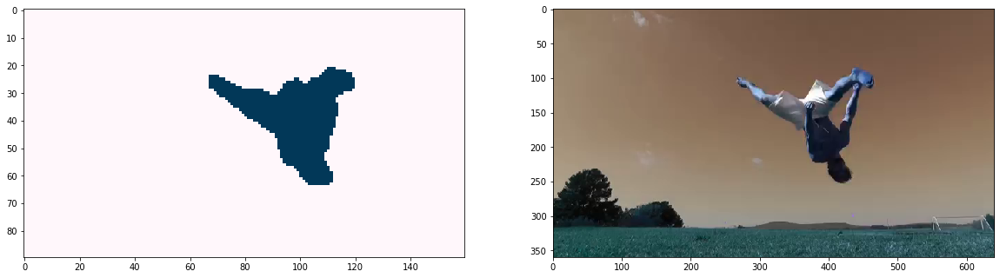

Frame processed: 180 Average time: 0.37024473481708103


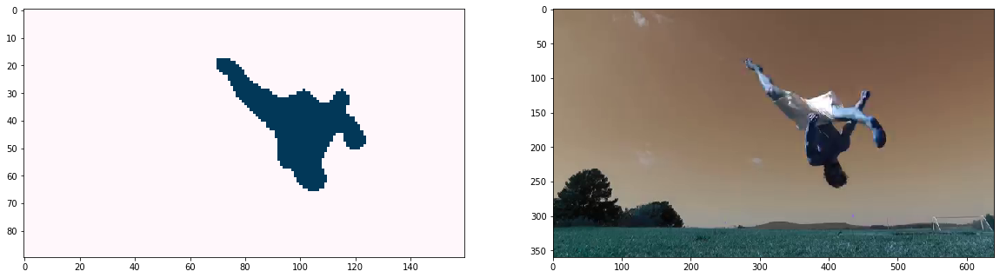

Frame processed: 181 Average time: 0.38538537894823277


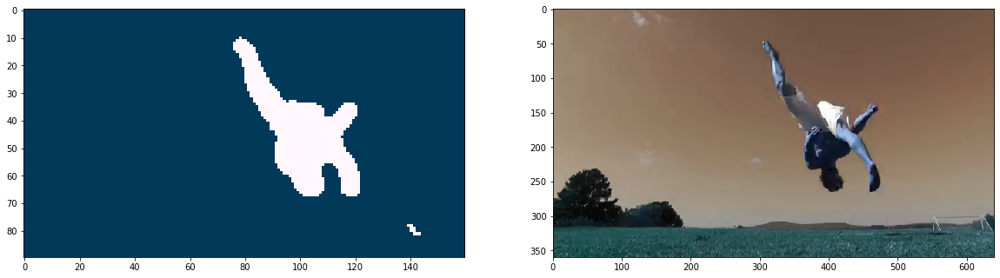

Frame processed: 182 Average time: 0.4007416701578832


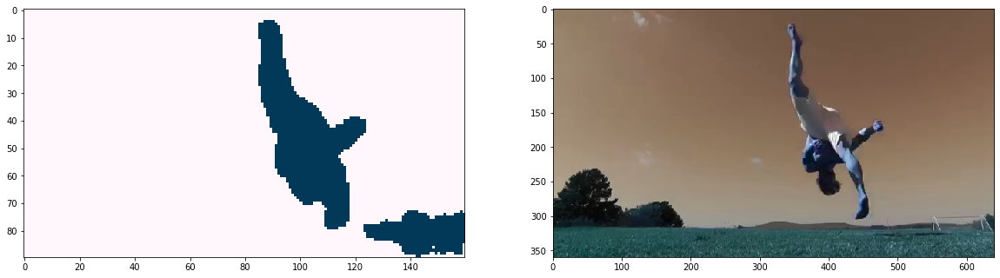

Frame processed: 183 Average time: 0.415763353389469


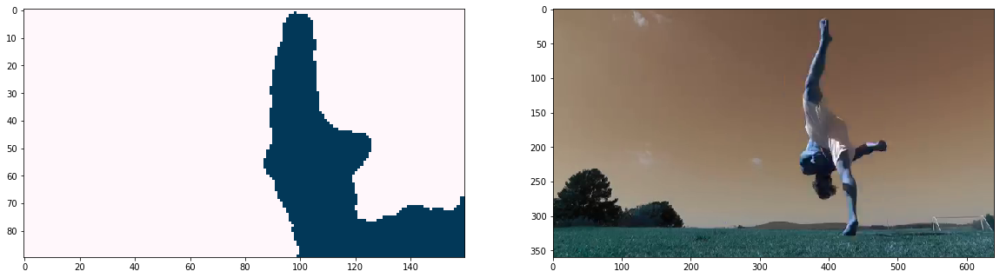

Frame processed: 184 Average time: 0.429863506037256


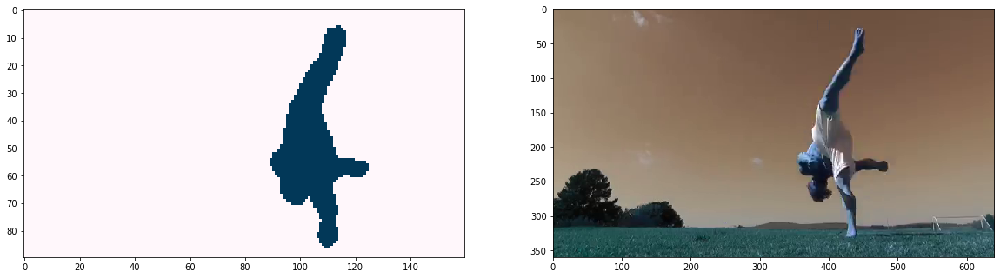

Frame processed: 185 Average time: 0.4444897290822622


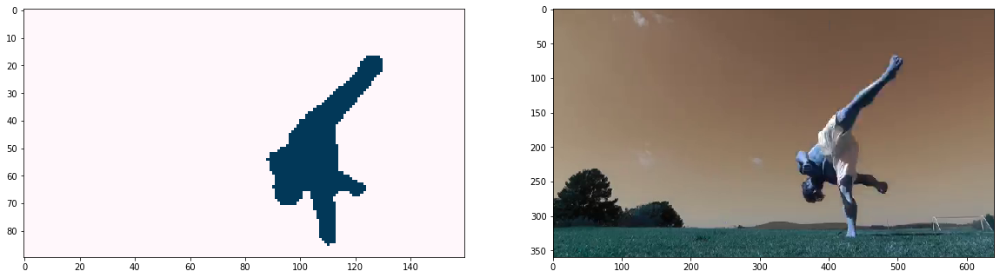

Frame processed: 186 Average time: 0.459378086110597


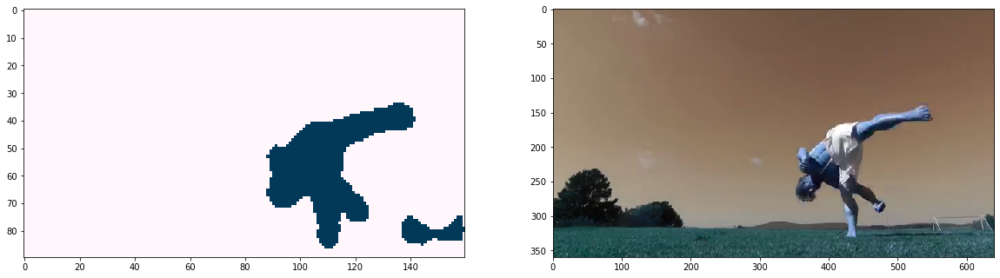

Frame processed: 187 Average time: 0.47342790894329867


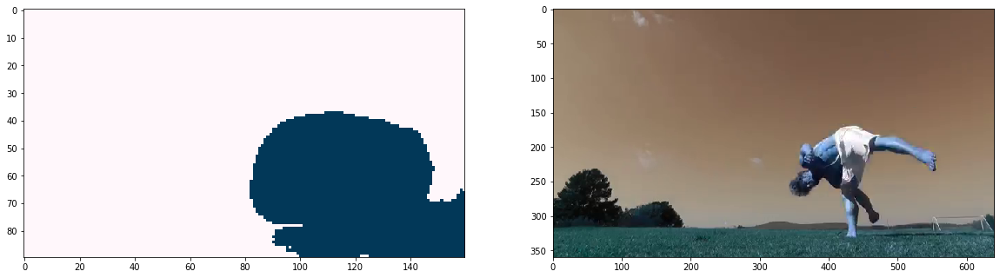

Frame processed: 188 Average time: 0.4868814044810356


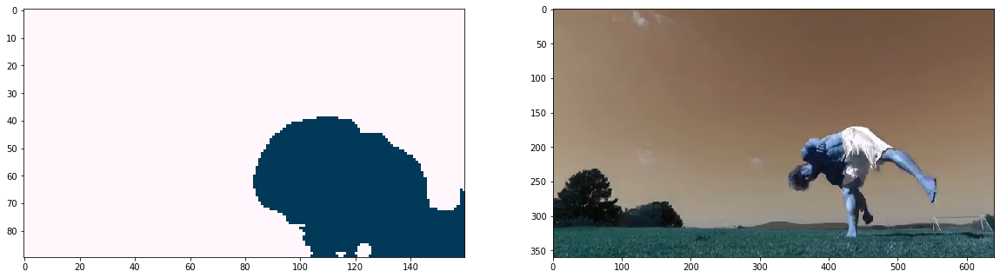

Frame processed: 189 Average time: 0.5006105735819176


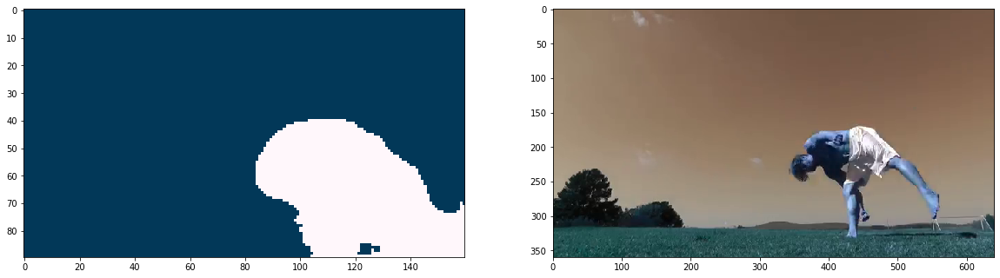

Frame processed: 190 Average time: 0.5139109937768234


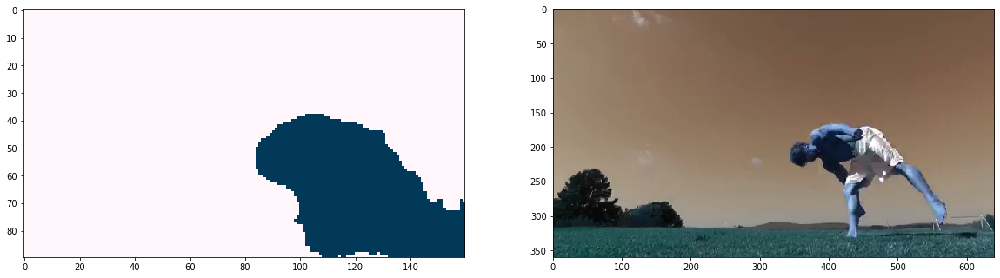

Frame processed: 191 Average time: 0.5278576169338526


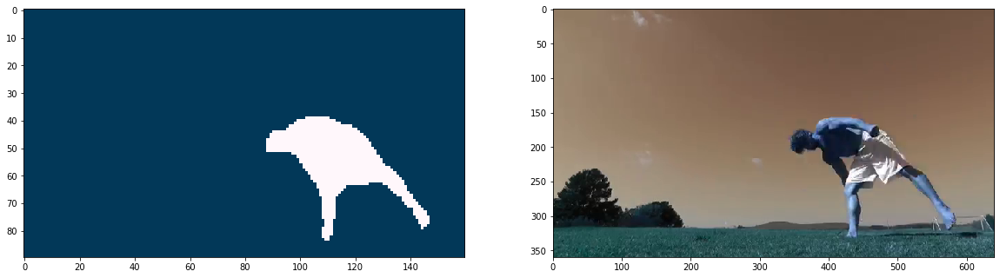

Frame processed: 192 Average time: 0.5414245376984278


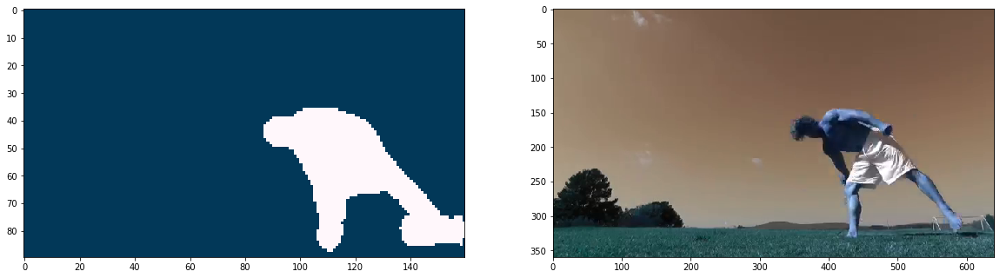

Frame processed: 193 Average time: 0.5545140436893917


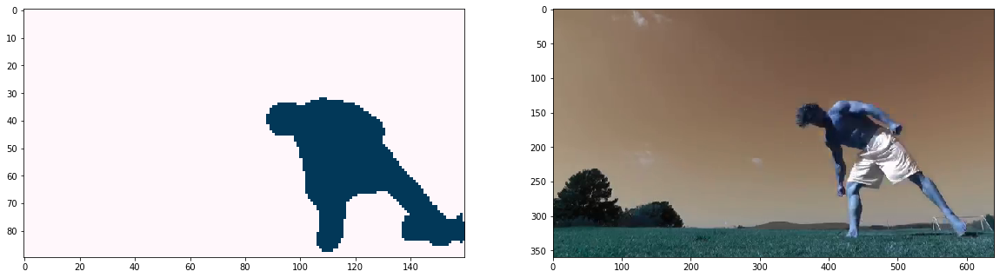

Frame processed: 194 Average time: 0.5674660144392977


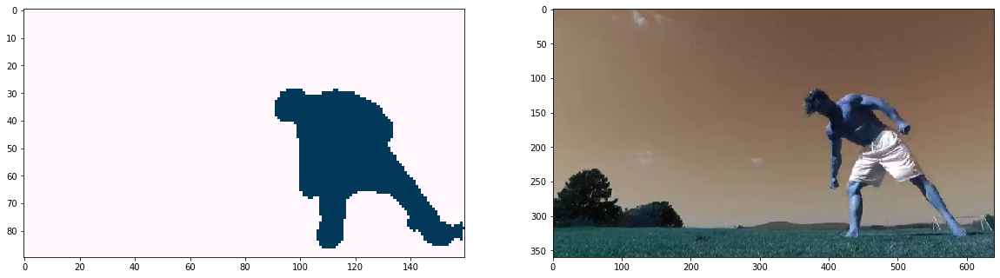

Frame processed: 195 Average time: 0.580287723052196


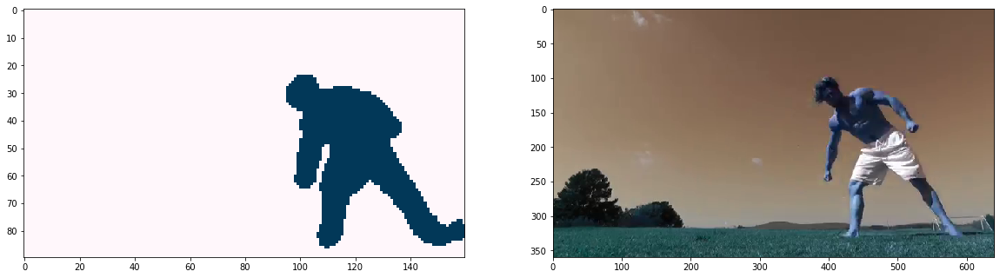

Frame processed: 196 Average time: 0.5926213349614825


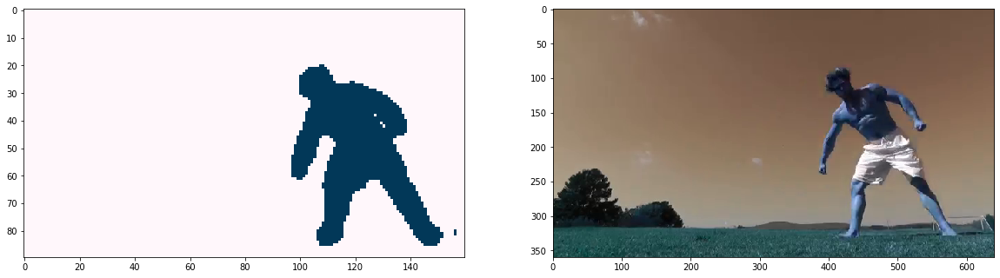

Frame processed: 197 Average time: 0.6048983014779648


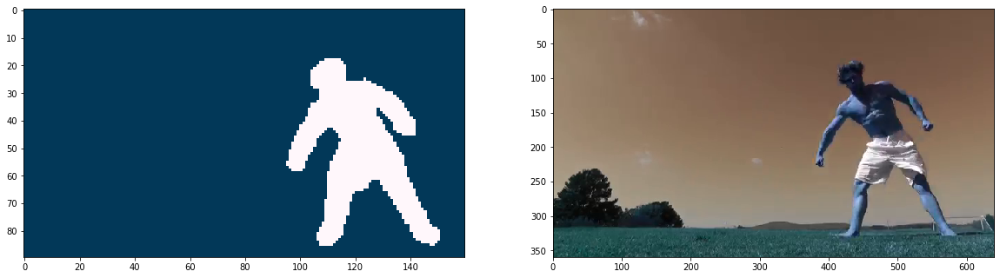

Frame processed: 198 Average time: 0.6173619477435796


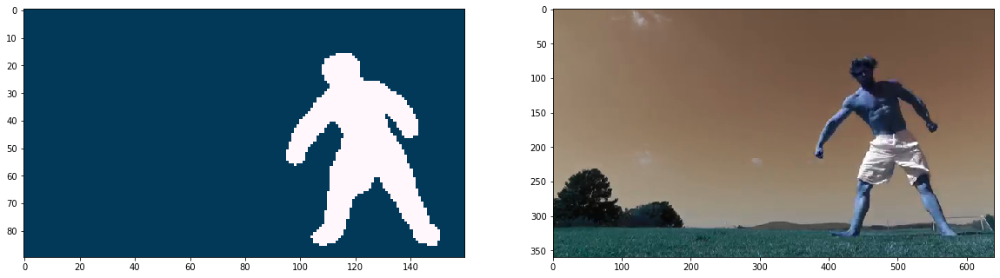

Frame processed: 199 Average time: 0.6294389262271287


In [5]:
while success:
    success, image = vidcap.read()
    if count in range(160, 200):
        start_time = time.time()
        new_image_features = deeplab.predict(image)    
        reduced_features = pca.fit_transform(new_image_features.reshape(-1, d))

        prediction = gmm_2.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)
        prediction_filtered = ndimage.maximum_filter(prediction, size=5)
        
        plt.subplot(1, 2, 1)
        plt.imshow(prediction, cmap='PuBu')
        plt.subplot(1, 2, 2)
        plt.imshow(image)
        plt.show()

        elapsed_time = time.time() - start_time
        sum_time += elapsed_time
        print('Frame processed:', count, 'Average time:', sum_time/count)
    count += 1

### Do the exact same process for a Gaussian Mixture Model with n = 4 clusters.

In [7]:
gmm_4 = GaussianMixture(n_components=4, covariance_type='tied')

del vidcap
vidcap = cv2.VideoCapture('C:\\Users\\me\\Desktop\\jujimufu.mp4')
success,image = vidcap.read()

count = 1
sum_time = 0

first_image_features = deeplab.predict(image)
n, w, h, d = first_image_features.shape

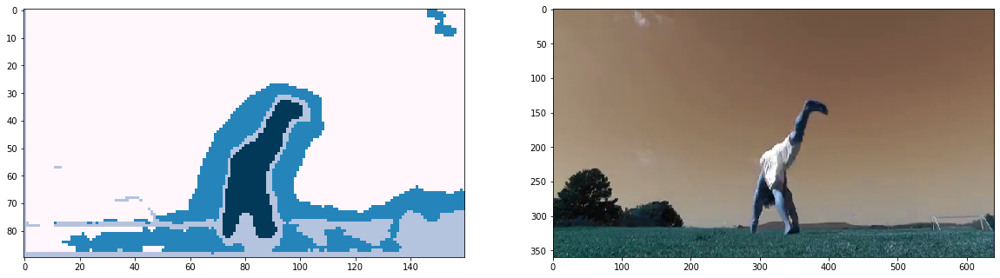

Frame processed: 160 Average time: 0.022008107602596284


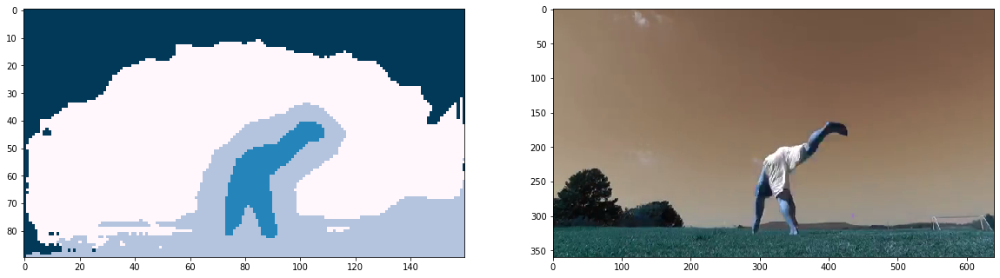

Frame processed: 161 Average time: 0.04159019008186293


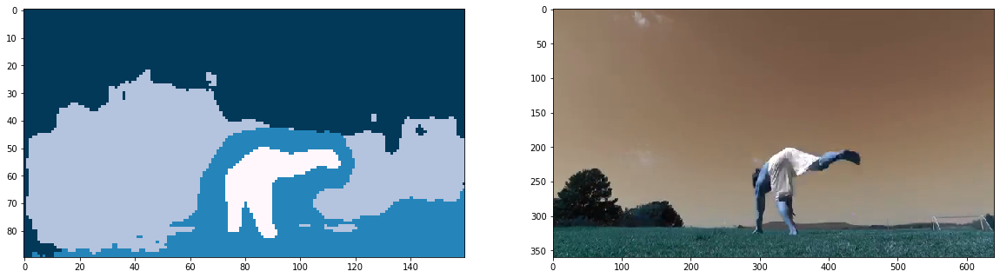

Frame processed: 162 Average time: 0.06067428323957655


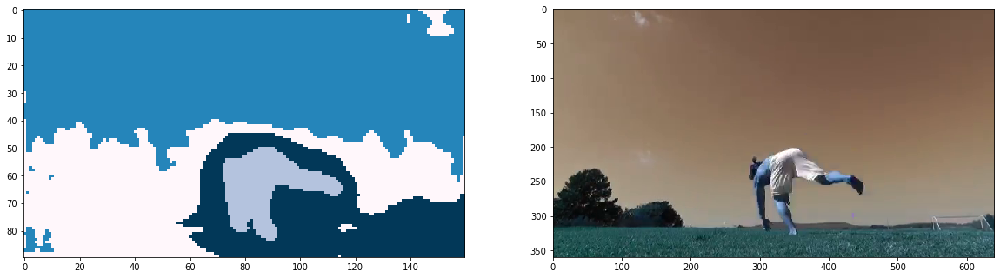

Frame processed: 163 Average time: 0.07917741910080237


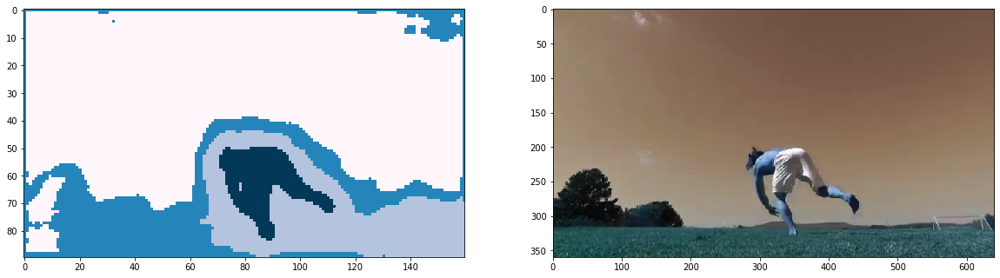

Frame processed: 164 Average time: 0.09863820017837896


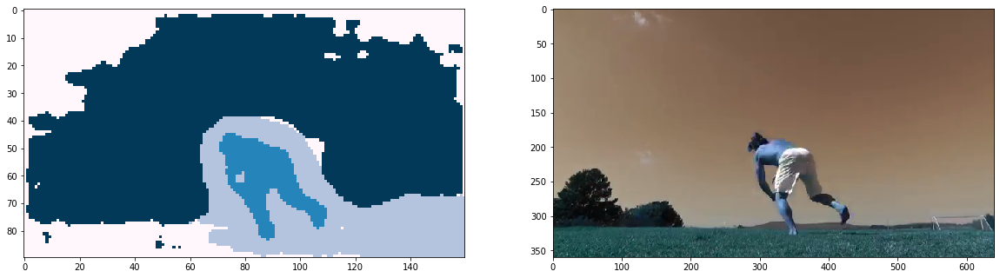

Frame processed: 165 Average time: 0.11781454230799819


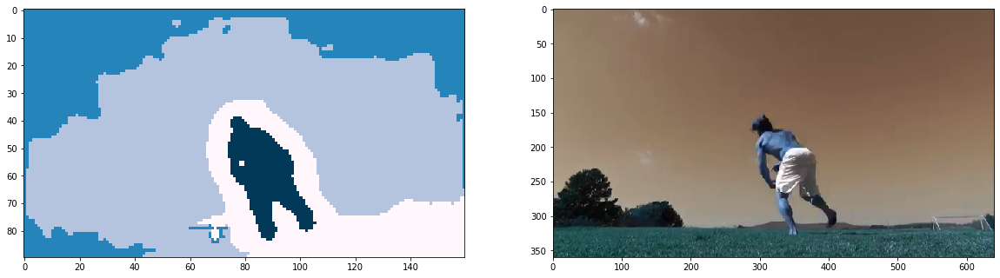

Frame processed: 166 Average time: 0.13580180219857088


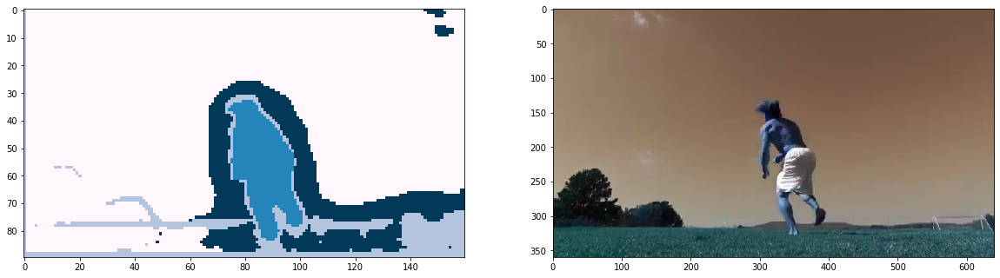

Frame processed: 167 Average time: 0.1538132678962753


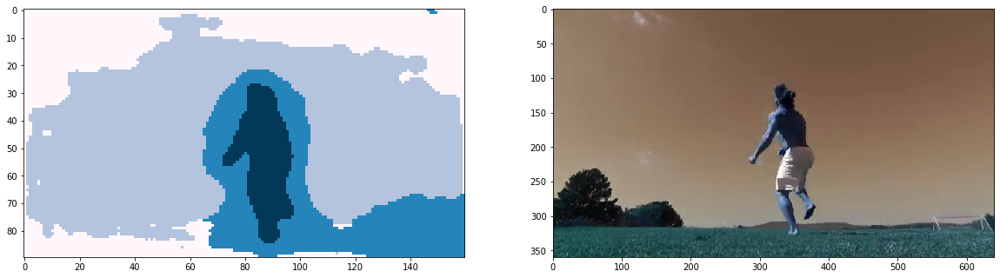

Frame processed: 168 Average time: 0.17148518846148536


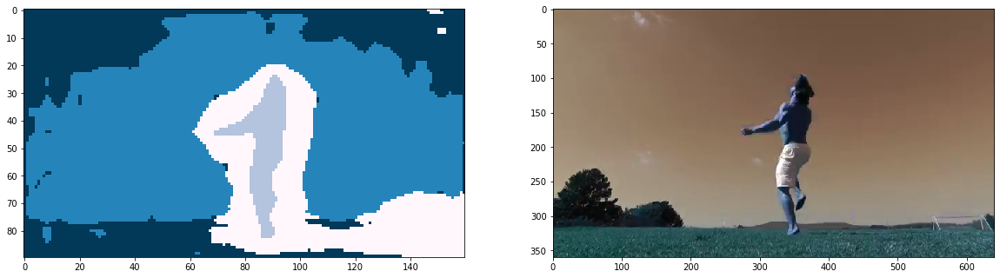

Frame processed: 169 Average time: 0.18965231737441565


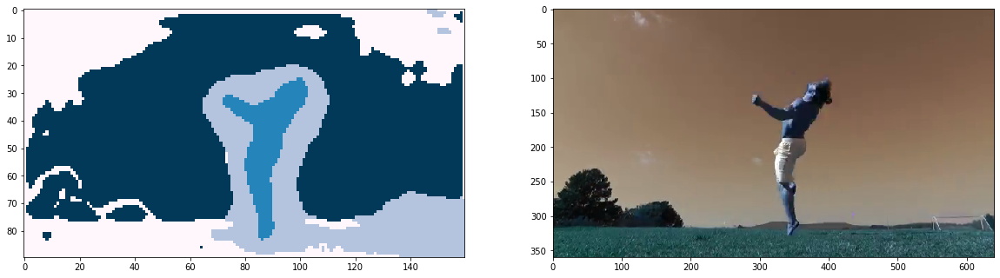

Frame processed: 170 Average time: 0.207052700659808


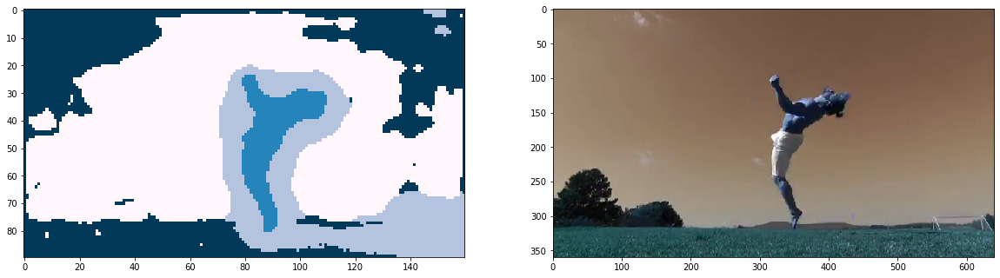

Frame processed: 171 Average time: 0.22486959284509134


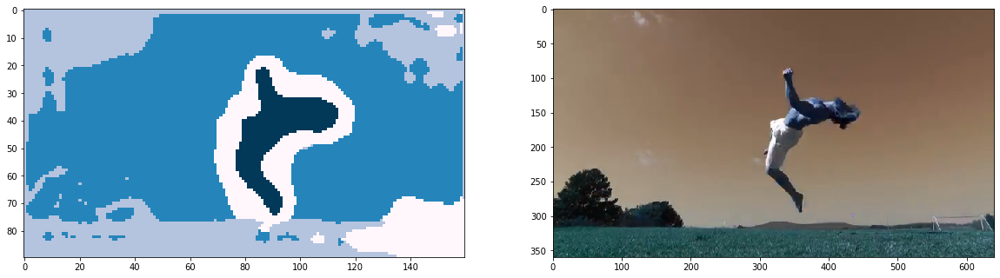

Frame processed: 172 Average time: 0.24152854708738106


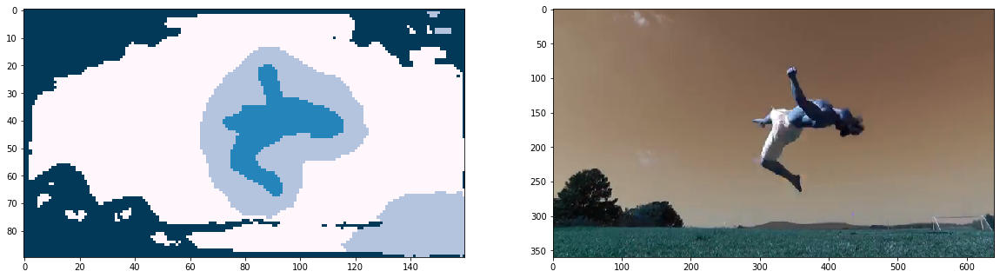

Frame processed: 173 Average time: 0.25928129901775737


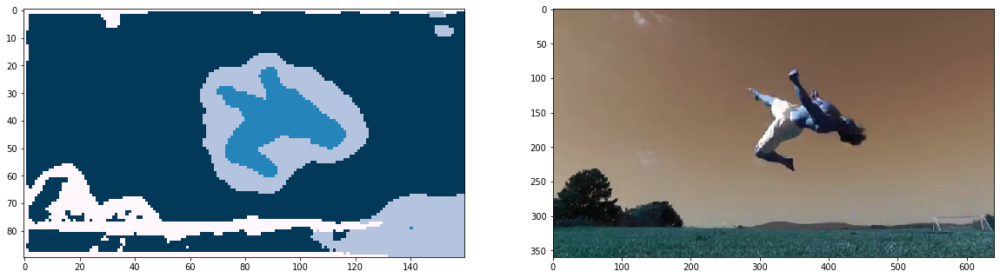

Frame processed: 174 Average time: 0.27652839545545904


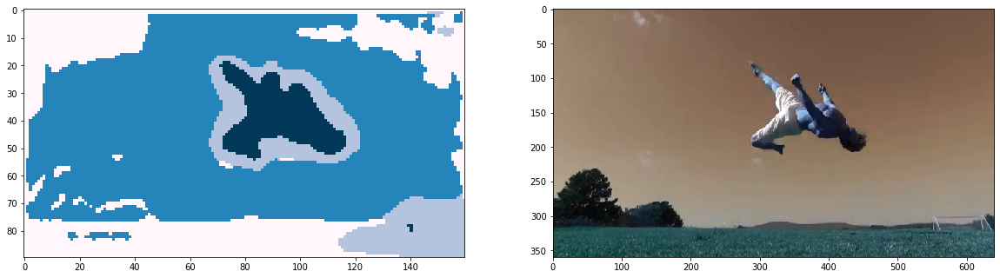

Frame processed: 175 Average time: 0.2929466233934675


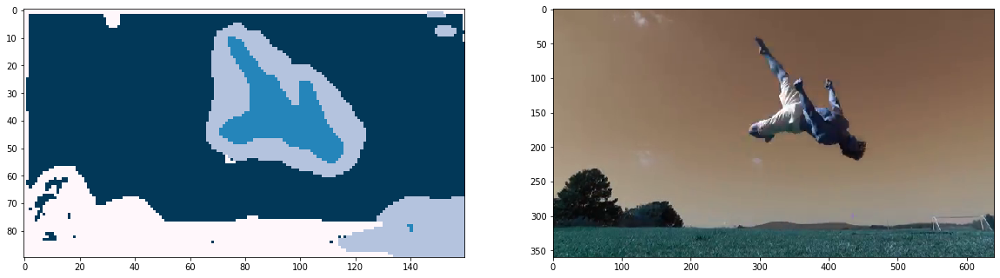

Frame processed: 176 Average time: 0.3087747340852564


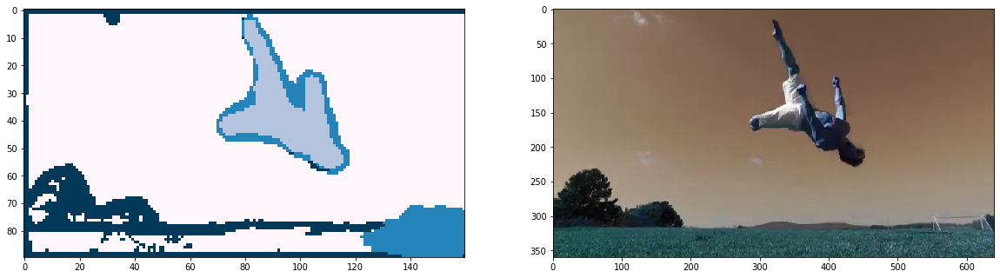

Frame processed: 177 Average time: 0.3247857026461154


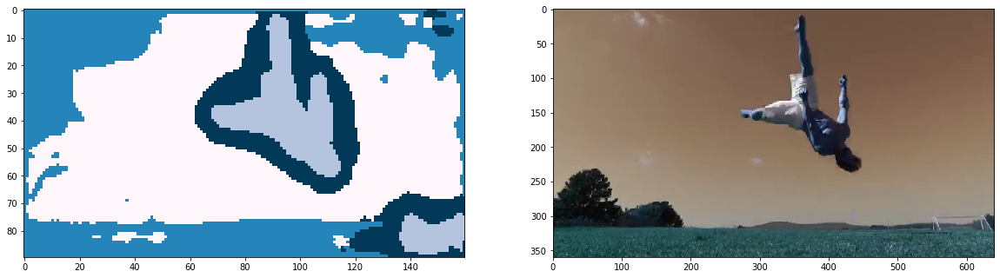

Frame processed: 178 Average time: 0.34014466371429103


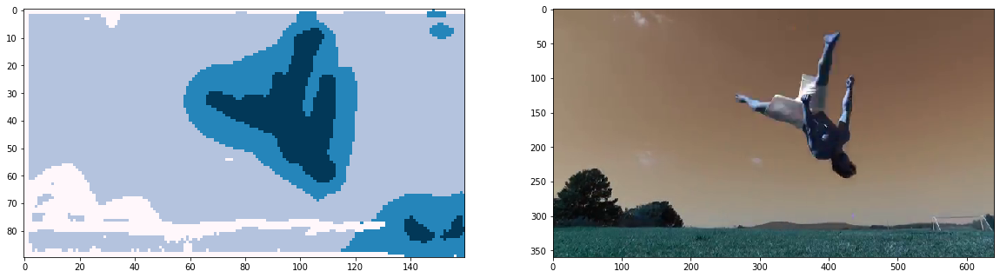

Frame processed: 179 Average time: 0.35627645487225923


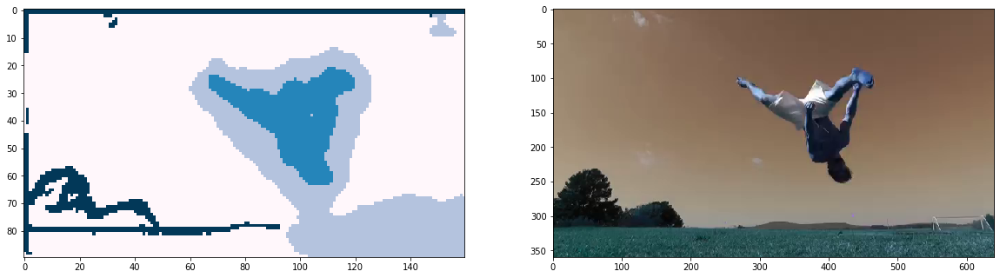

Frame processed: 180 Average time: 0.3726345618565877


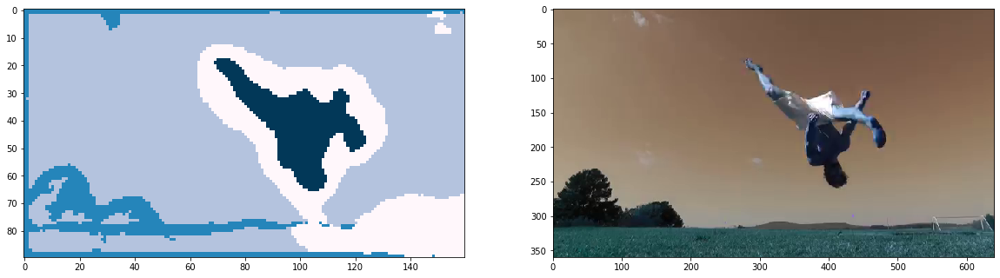

Frame processed: 181 Average time: 0.38754100430736227


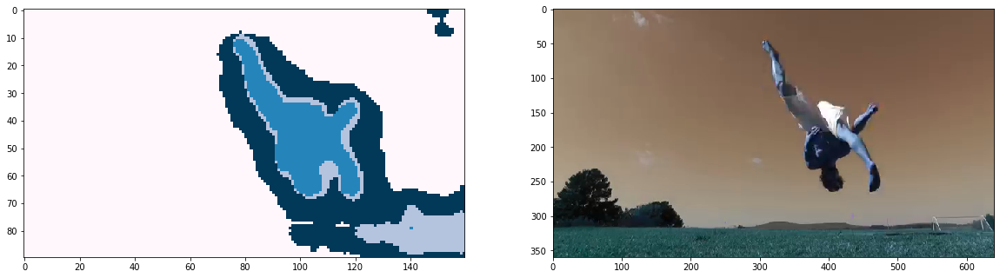

Frame processed: 182 Average time: 0.402596849661607


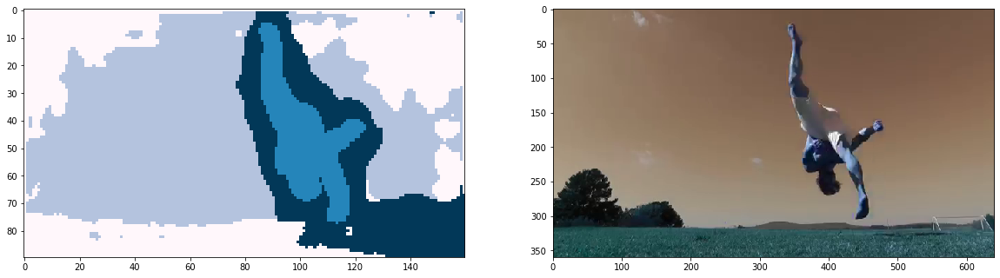

Frame processed: 183 Average time: 0.41707825009288685


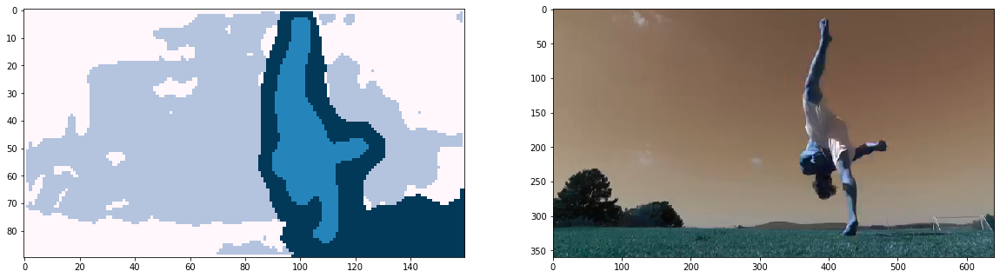

Frame processed: 184 Average time: 0.43141312832417694


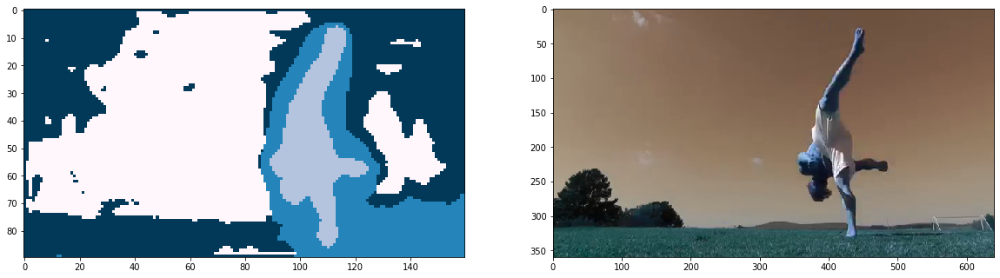

Frame processed: 185 Average time: 0.4459471998987971


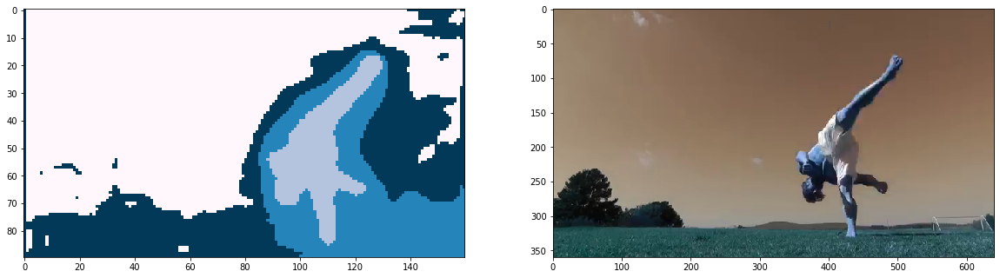

Frame processed: 186 Average time: 0.45974679018861503


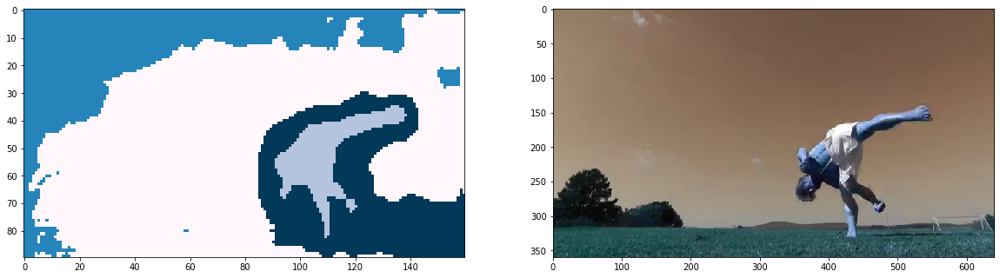

Frame processed: 187 Average time: 0.4739897952360265


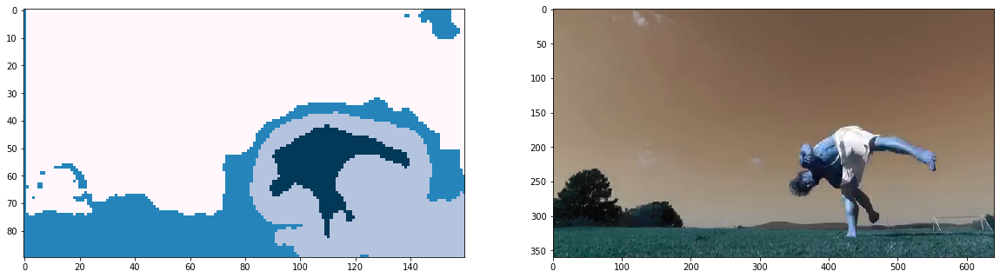

Frame processed: 188 Average time: 0.48775952039880954


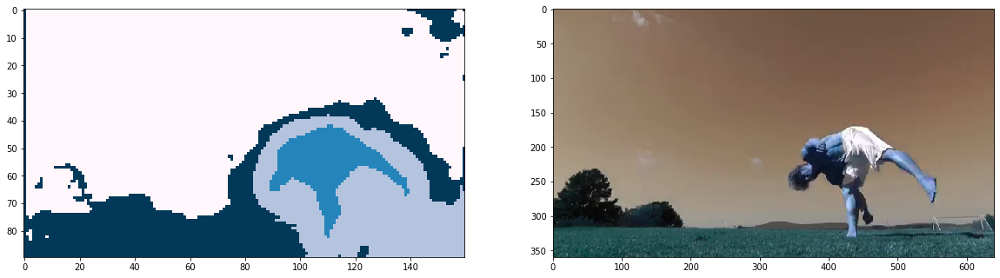

Frame processed: 189 Average time: 0.501134714752278


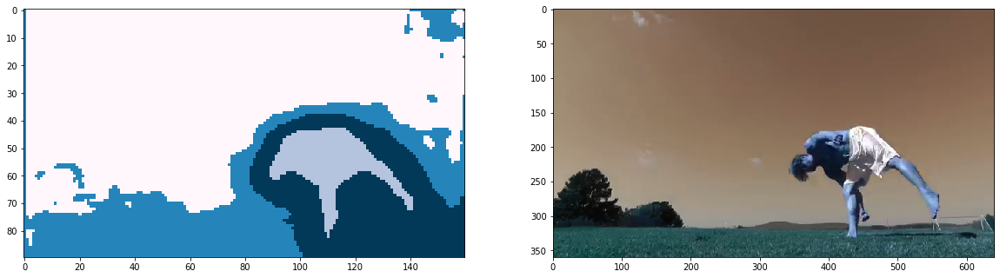

Frame processed: 190 Average time: 0.5148008785749737


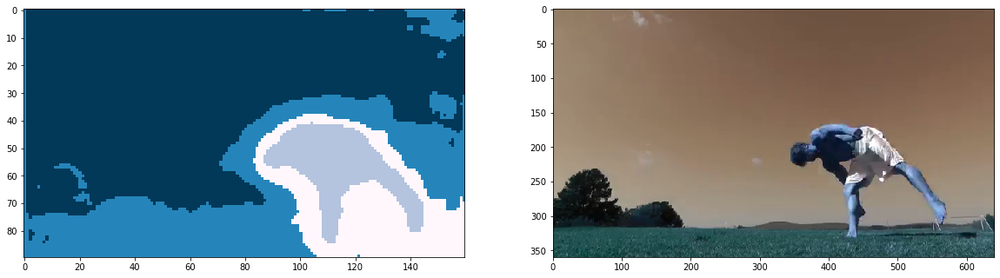

Frame processed: 191 Average time: 0.5293031737442416


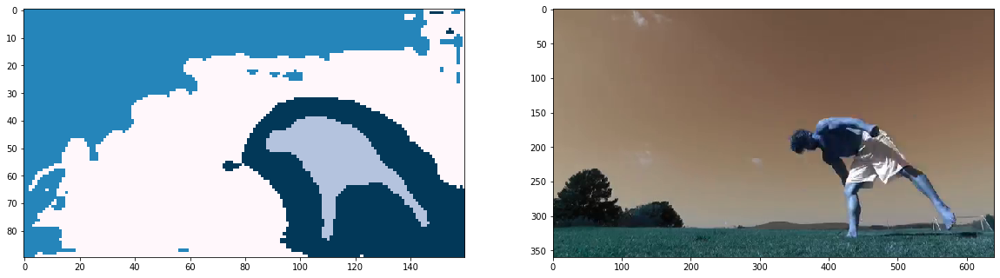

Frame processed: 192 Average time: 0.5428678169846535


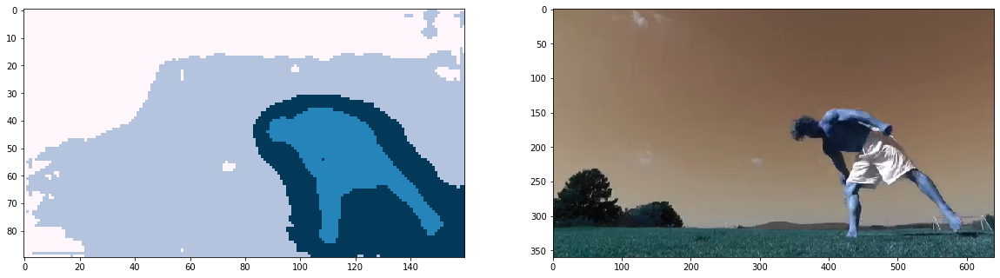

Frame processed: 193 Average time: 0.555809835078185


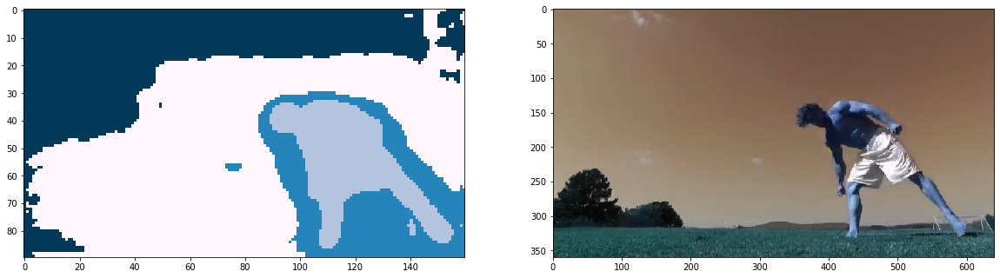

Frame processed: 194 Average time: 0.5692474817492298


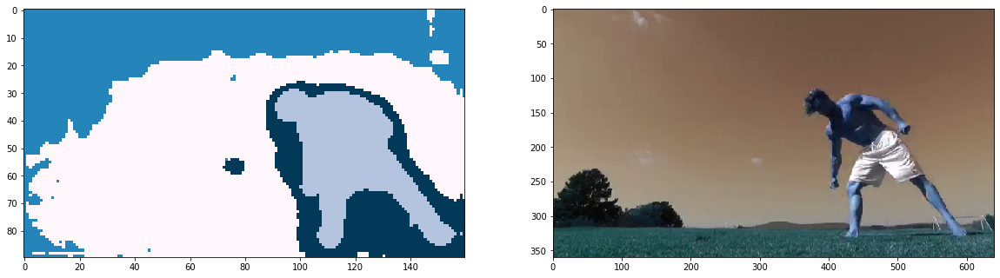

Frame processed: 195 Average time: 0.5822908756060478


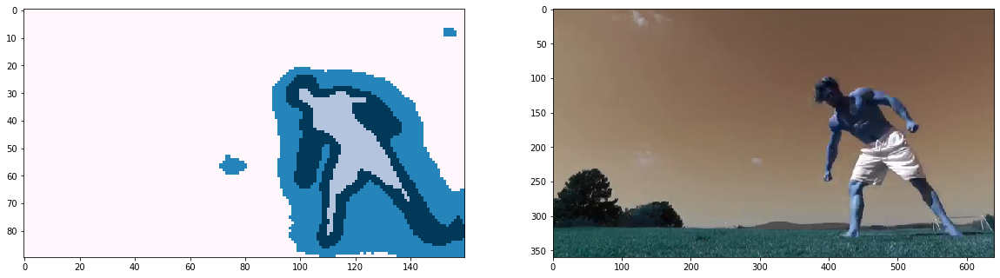

Frame processed: 196 Average time: 0.594971447574849


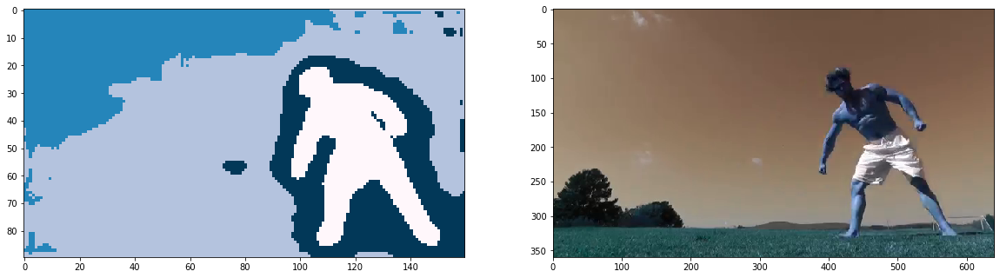

Frame processed: 197 Average time: 0.6078178519524898


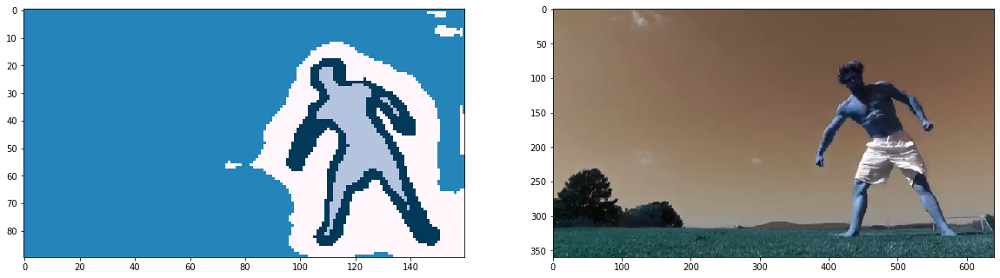

Frame processed: 198 Average time: 0.6202895087425155


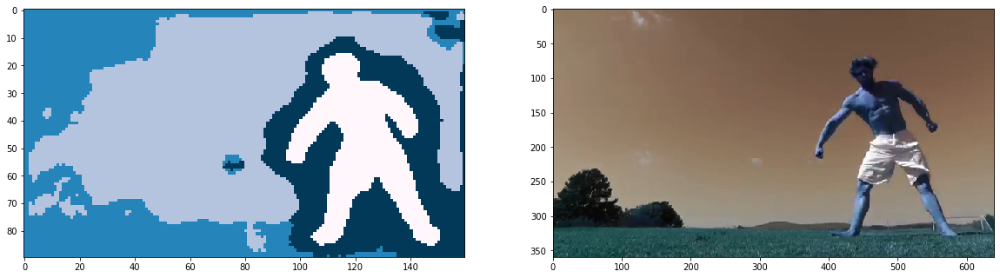

Frame processed: 199 Average time: 0.6329046254181981


In [8]:
while success:
    success, image = vidcap.read()
    if count in range(160, 200):
        start_time = time.time()
        new_image_features = deeplab.predict(image)    
        reduced_features = pca.fit_transform(new_image_features.reshape(-1, d))

        prediction = gmm_4.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)
        prediction_filtered = ndimage.maximum_filter(prediction, size=5)
        
        plt.subplot(1, 2, 1)
        plt.imshow(prediction, cmap='PuBu')
        plt.subplot(1, 2, 2)
        plt.imshow(image)
        plt.show()

        elapsed_time = time.time() - start_time
        sum_time += elapsed_time
        print('Frame processed:', count, 'Average time:', sum_time/count)
    count += 1

### Same for a Gaussian Mixture Model with n = 6 clusters.

In [9]:
gmm_6 = GaussianMixture(n_components=6, covariance_type='tied')

del vidcap
vidcap = cv2.VideoCapture('C:\\Users\\me\\Desktop\\jujimufu.mp4')
success,image = vidcap.read()

count = 1
sum_time = 0

first_image_features = deeplab.predict(image)
n, w, h, d = first_image_features.shape

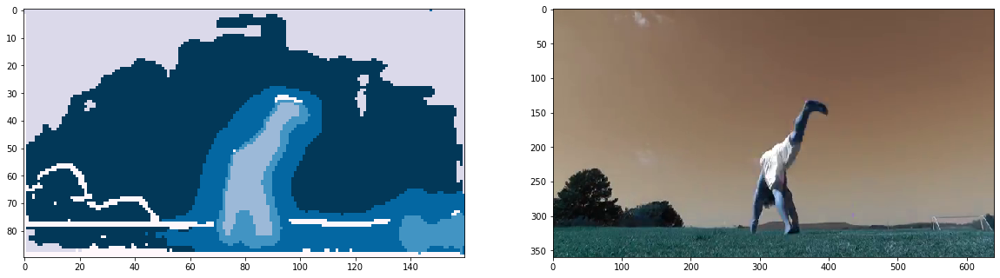

Frame processed: 160 Average time: 0.021117262542247772


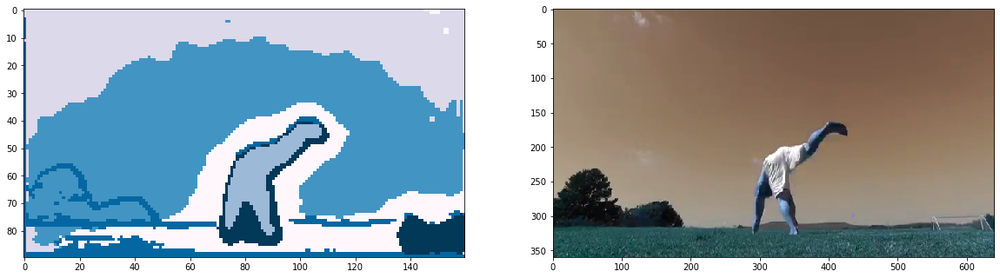

Frame processed: 161 Average time: 0.04086018941417244


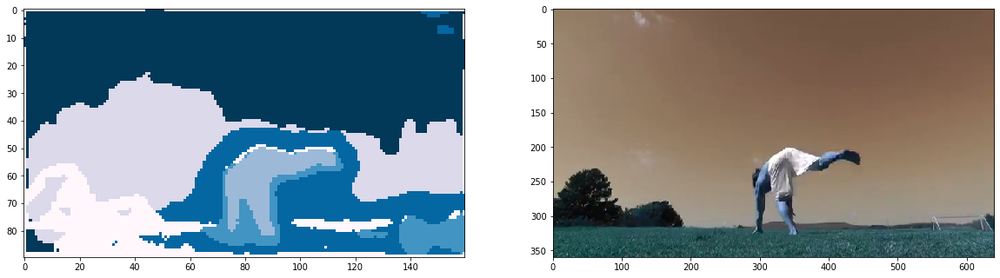

Frame processed: 162 Average time: 0.06127619154659318


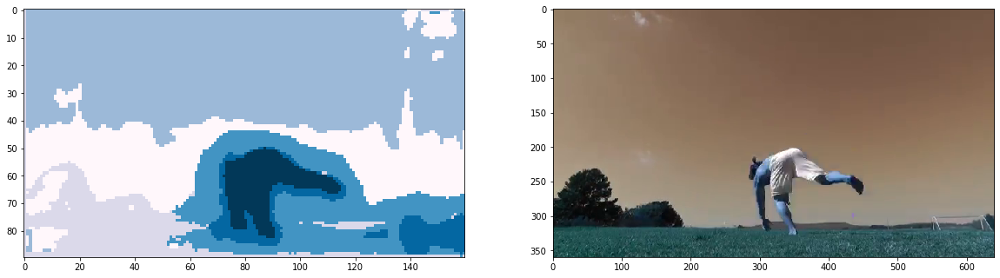

Frame processed: 163 Average time: 0.08097845937576761


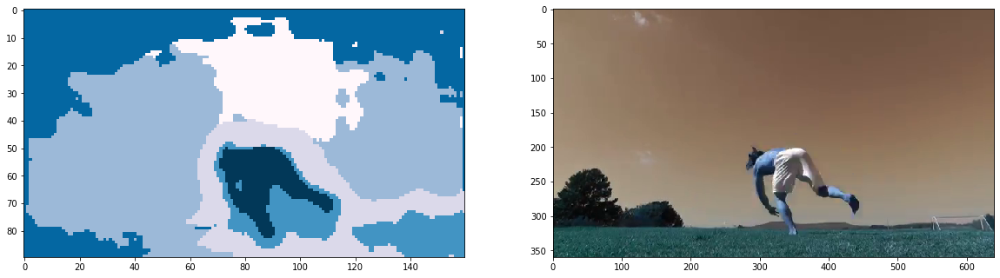

Frame processed: 164 Average time: 0.10007451656388074


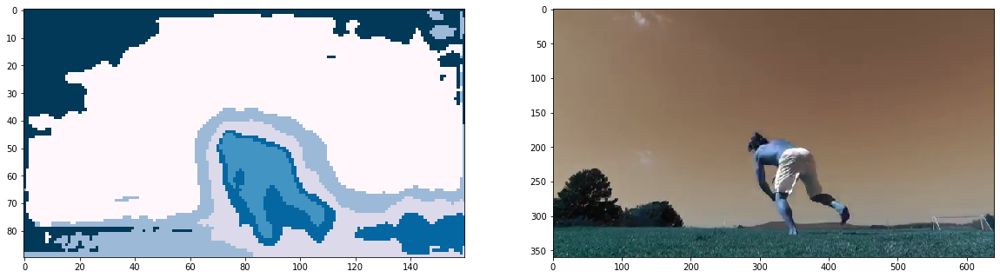

Frame processed: 165 Average time: 0.12169119228016247


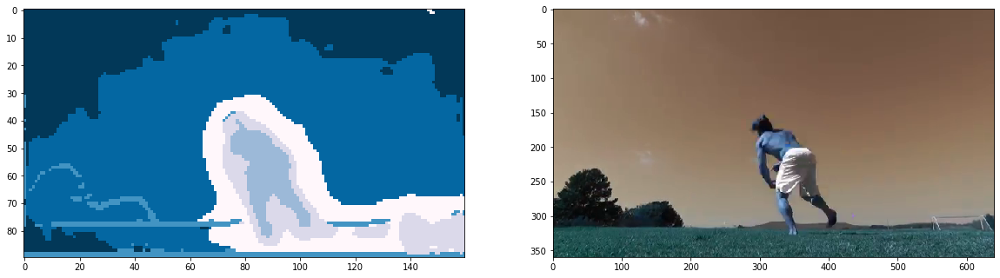

Frame processed: 166 Average time: 0.1402033955217844


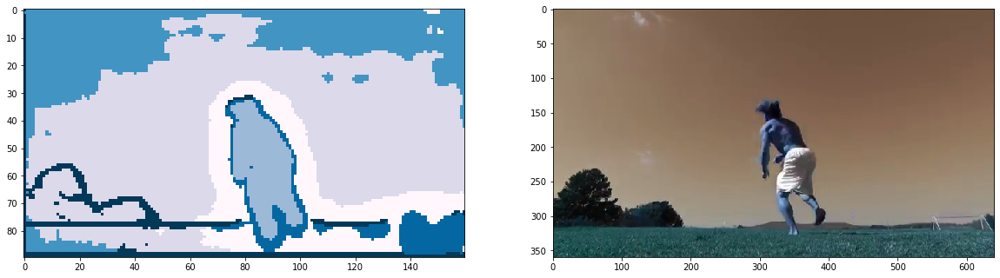

Frame processed: 167 Average time: 0.15820048098078746


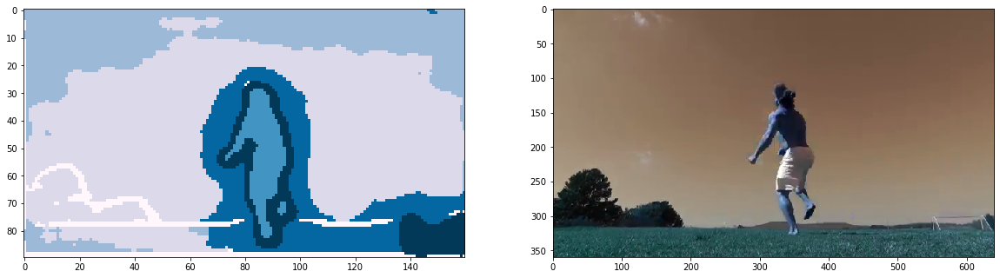

Frame processed: 168 Average time: 0.17636735808281673


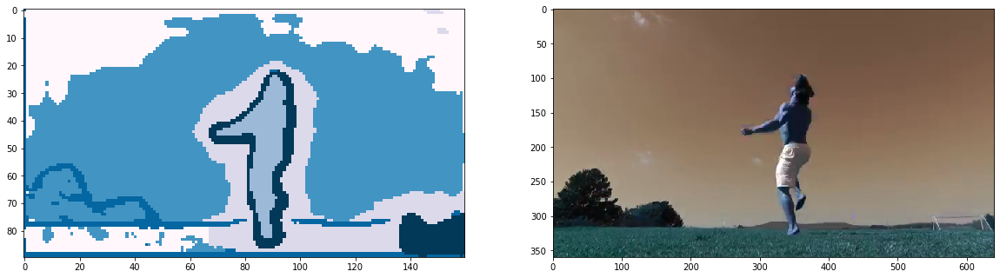

Frame processed: 169 Average time: 0.19368884972566683


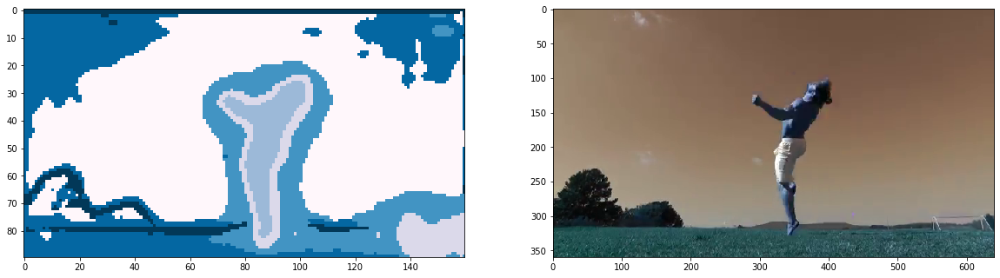

Frame processed: 170 Average time: 0.21088575475356158


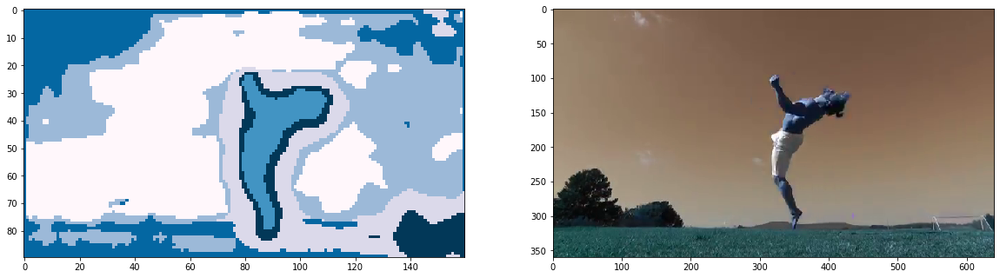

Frame processed: 171 Average time: 0.22791982812491077


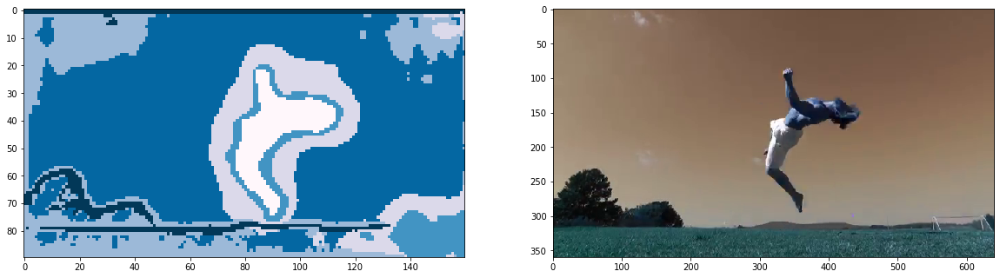

Frame processed: 172 Average time: 0.24691910521928653


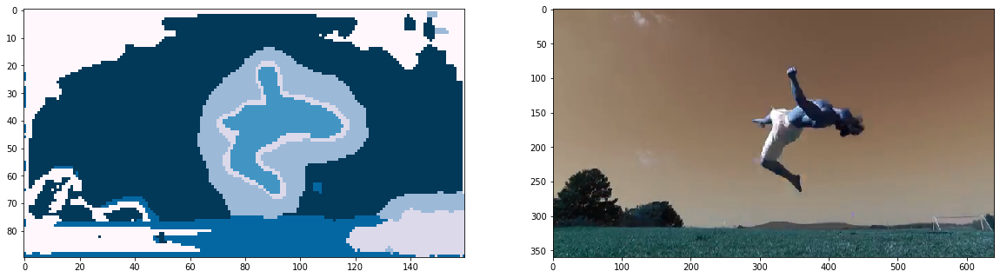

Frame processed: 173 Average time: 0.2632761814690739


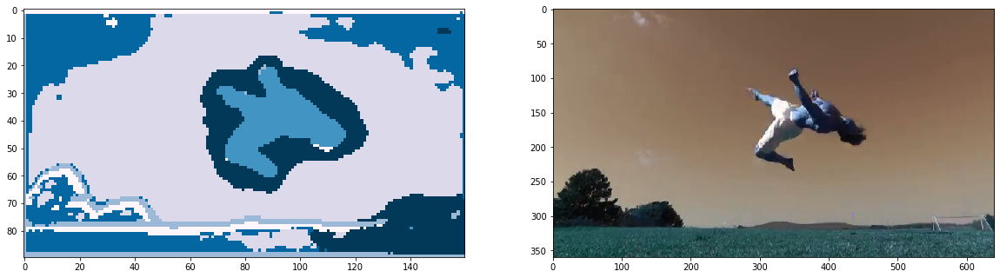

Frame processed: 174 Average time: 0.27973845909381734


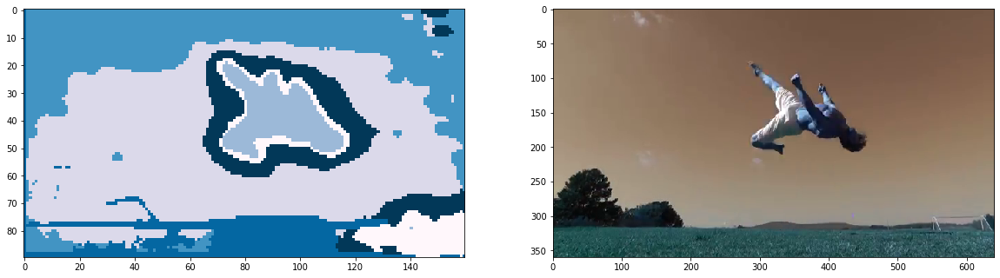

Frame processed: 175 Average time: 0.295801123210362


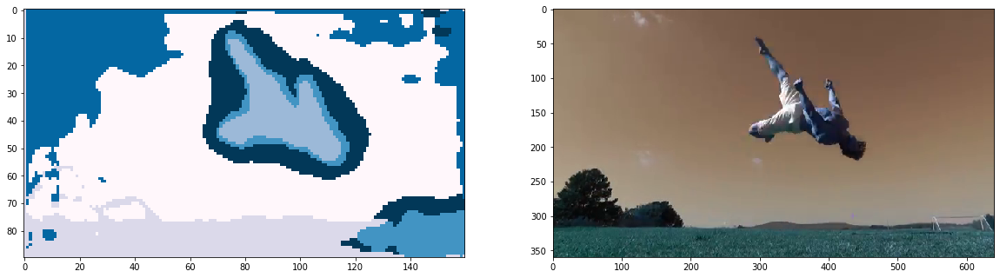

Frame processed: 176 Average time: 0.31194831701842224


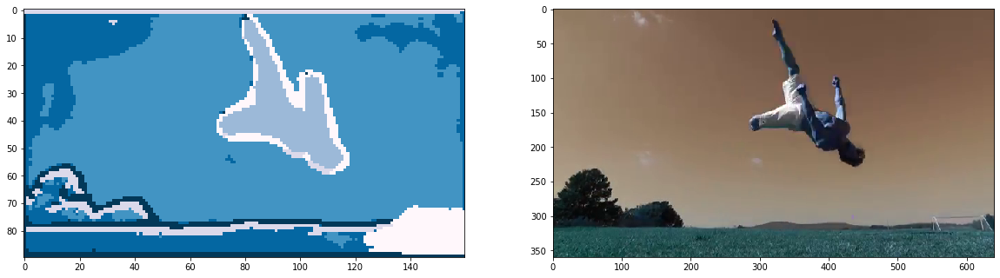

Frame processed: 177 Average time: 0.32852905887668415


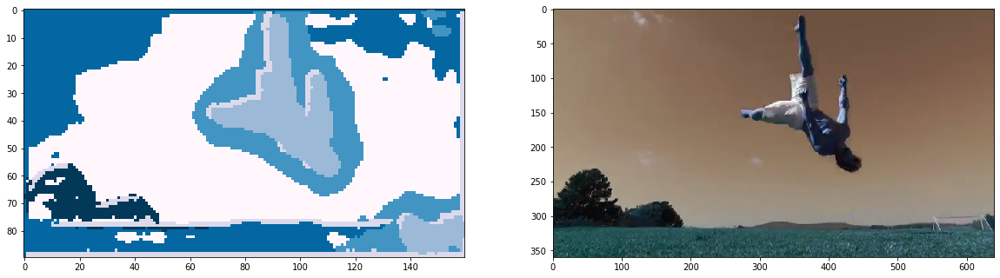

Frame processed: 178 Average time: 0.344263268320748


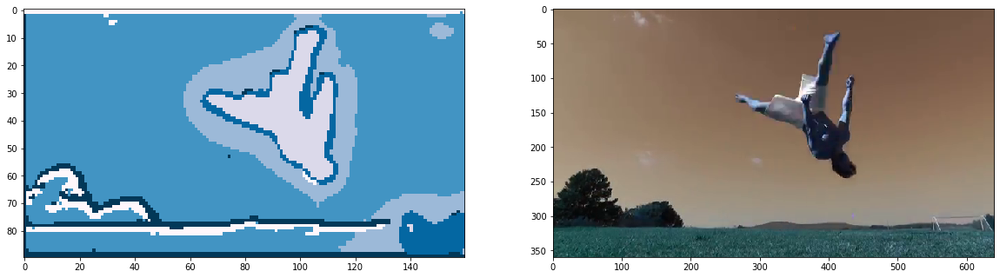

Frame processed: 179 Average time: 0.36205394973967997


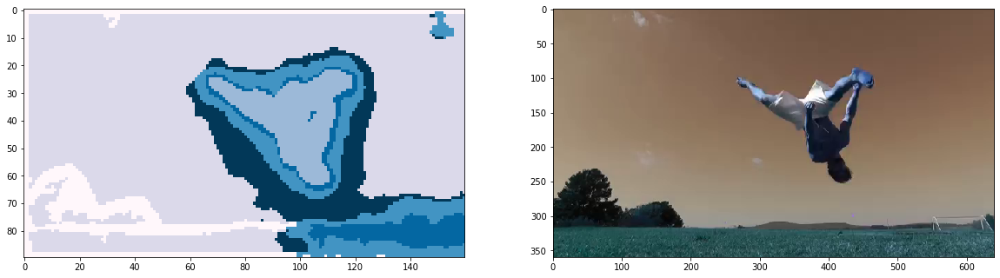

Frame processed: 180 Average time: 0.37826056480407716


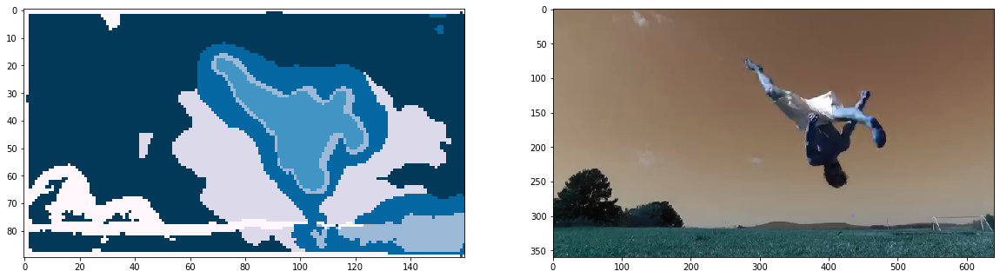

Frame processed: 181 Average time: 0.3934895439042571


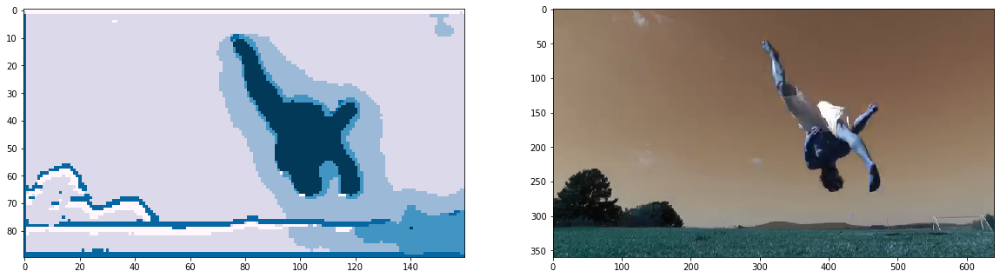

Frame processed: 182 Average time: 0.4080511082659711


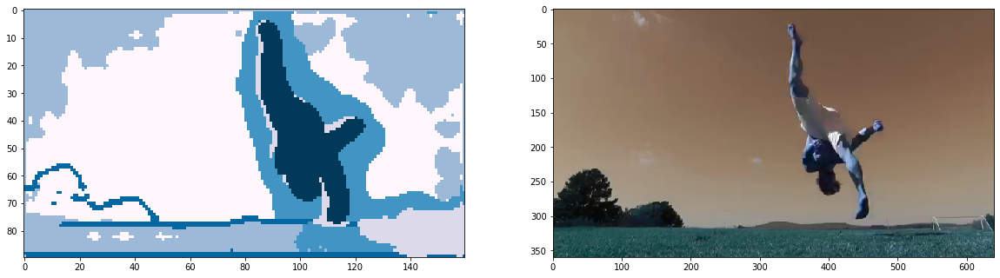

Frame processed: 183 Average time: 0.42302191843752


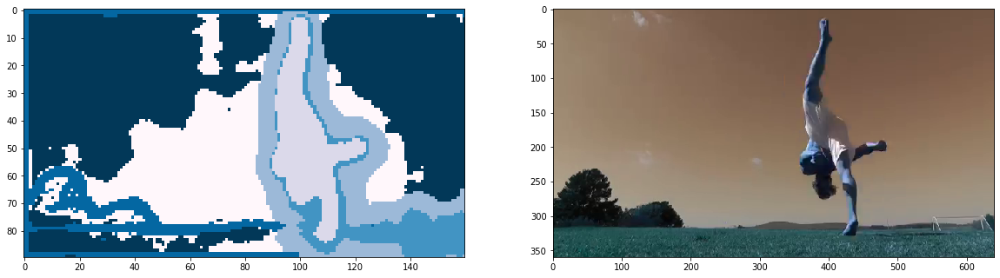

Frame processed: 184 Average time: 0.43821595933126367


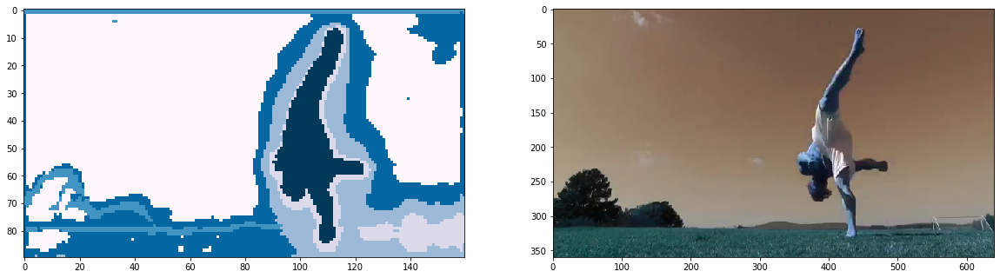

Frame processed: 185 Average time: 0.4535269273293985


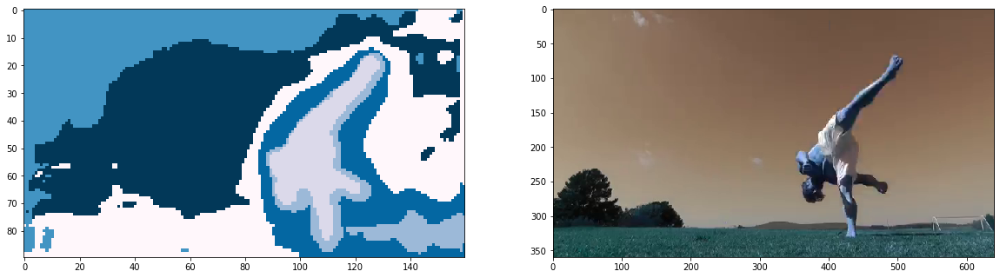

Frame processed: 186 Average time: 0.4681946167381861


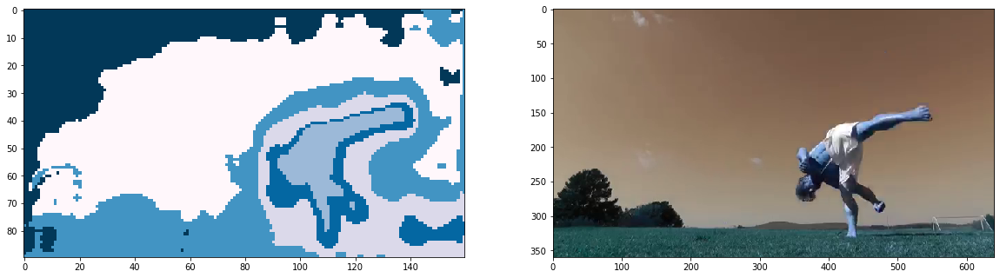

Frame processed: 187 Average time: 0.4825557081457128


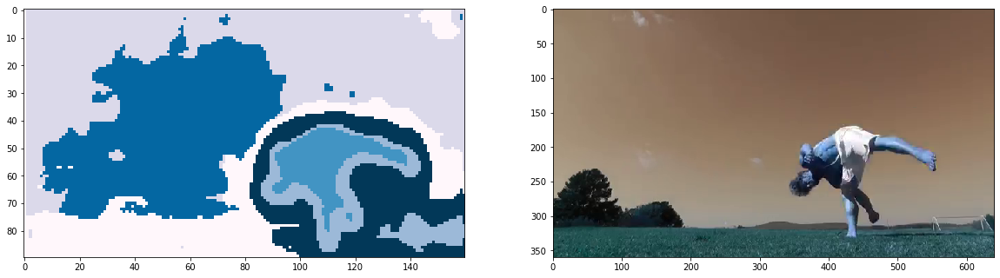

Frame processed: 188 Average time: 0.49737049417292817


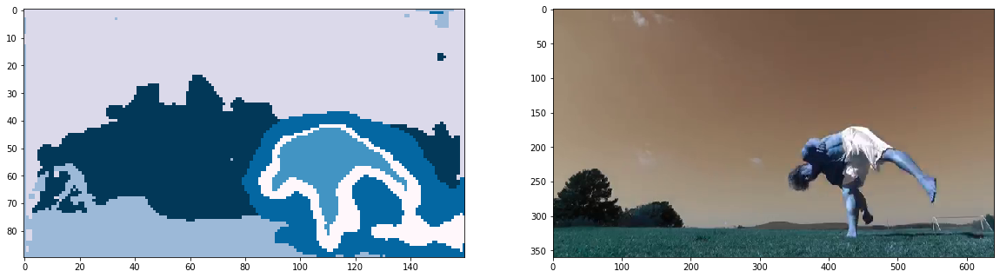

Frame processed: 189 Average time: 0.5112506056588794


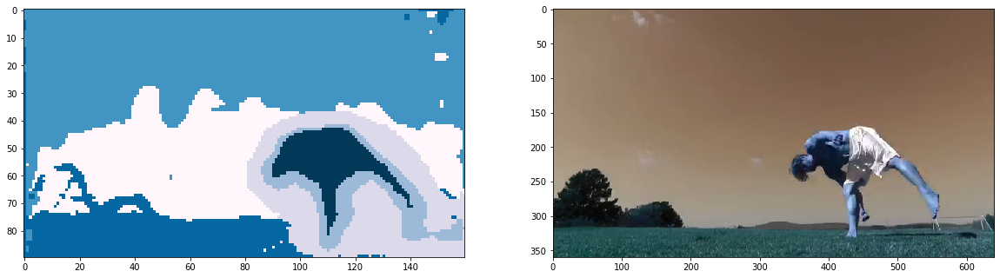

Frame processed: 190 Average time: 0.525429243790476


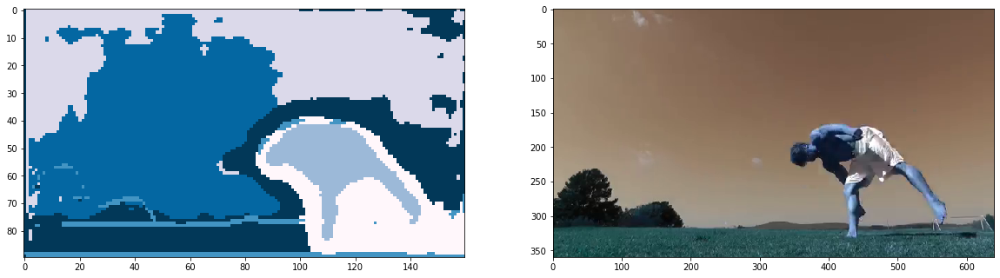

Frame processed: 191 Average time: 0.5400801753498496


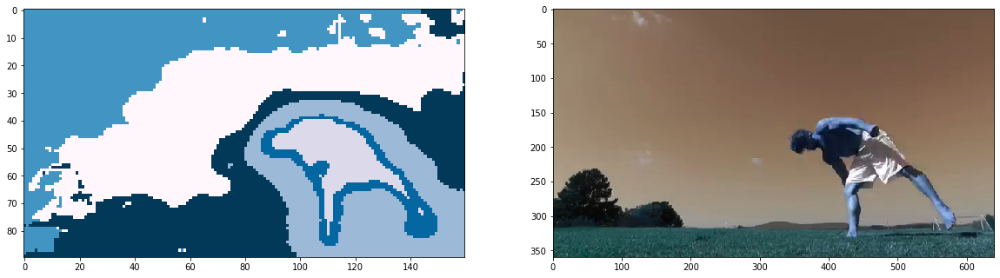

Frame processed: 192 Average time: 0.554766030361255


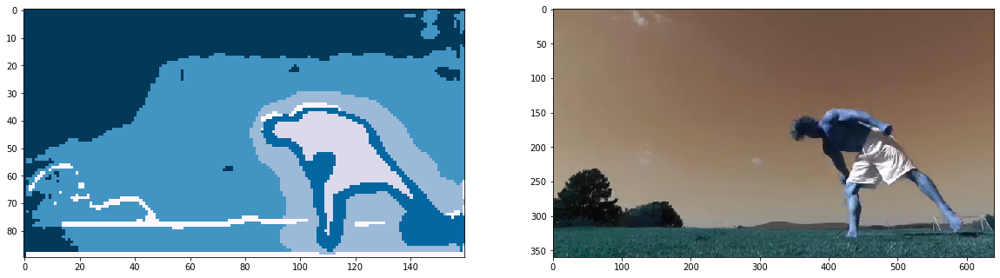

Frame processed: 193 Average time: 0.5693359807365299


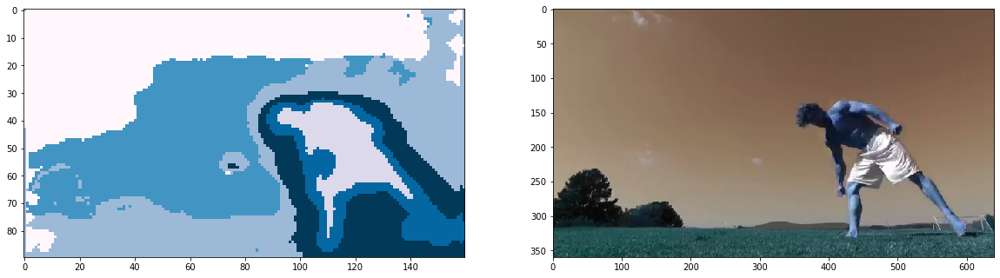

Frame processed: 194 Average time: 0.5821006359513273


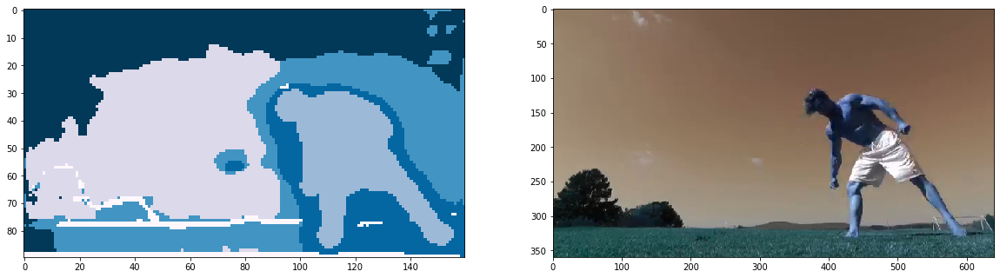

Frame processed: 195 Average time: 0.5954935917487512


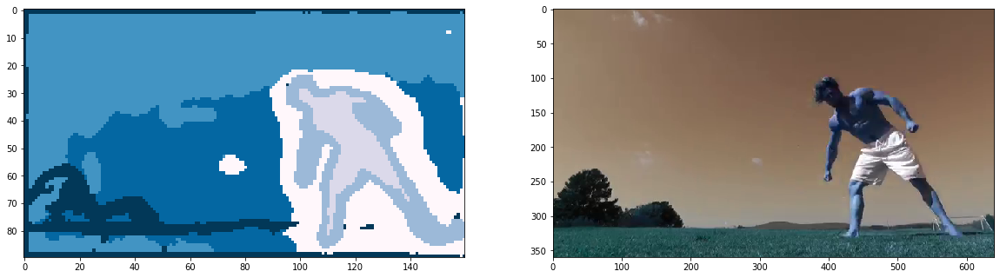

Frame processed: 196 Average time: 0.6084232391143332


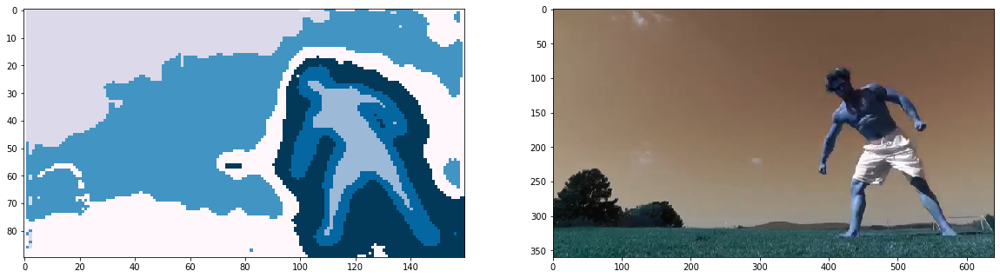

Frame processed: 197 Average time: 0.6211353134987924


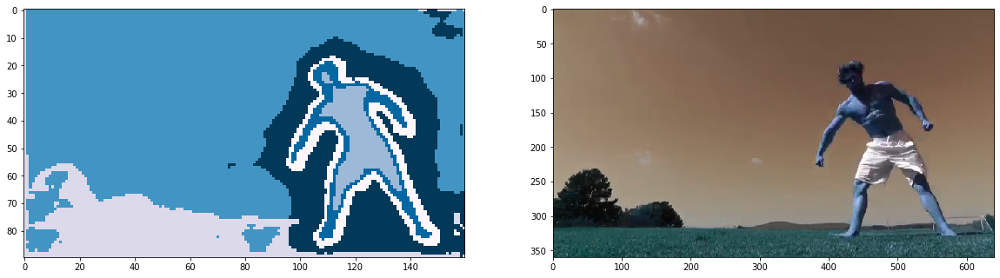

Frame processed: 198 Average time: 0.6360174790777341


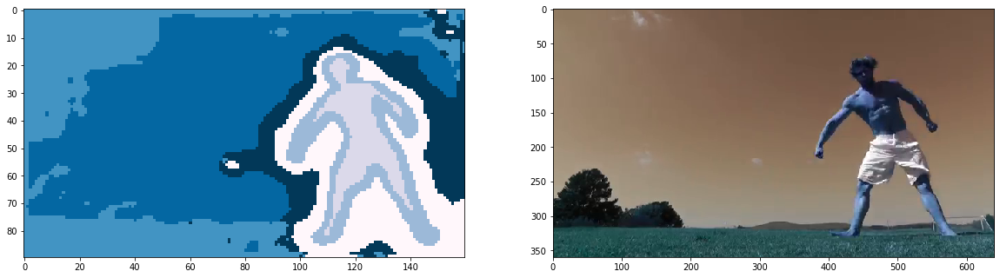

Frame processed: 199 Average time: 0.6483324856015306


In [10]:
while success:
    success, image = vidcap.read()
    if count in range(160, 200):
        start_time = time.time()
        new_image_features = deeplab.predict(image)    
        reduced_features = pca.fit_transform(new_image_features.reshape(-1, d))

        prediction = gmm_6.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)
        prediction_filtered = ndimage.maximum_filter(prediction, size=5)
        
        plt.subplot(1, 2, 1)
        plt.imshow(prediction, cmap='PuBu')
        plt.subplot(1, 2, 2)
        plt.imshow(image)
        plt.show()

        elapsed_time = time.time() - start_time
        sum_time += elapsed_time
        print('Frame processed:', count, 'Average time:', sum_time/count)
    count += 1

#### Video provided by famous crazy person jujimufu :3